In [147]:
#Read in folder with data to be aligned and output directory for saving data
directory_name = '/Users/rufusmitchell-heggs/Desktop/data_analysis/preprocessing/event_arena/H0466/'
output_directory = directory_name+'output_directory/'

In [148]:
import os
import time
os.chdir('/Users/rufusmitchell-heggs/Desktop/data_analysis/preprocessing/event_arena/')
import preprocessing_ea_old
import place_cell_functions
import multiprocessing as mp
from _thread import start_new_thread

import pandas as pd
import numpy as np
import math

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import gridspec
import seaborn as sns

from scipy import stats
from scipy.spatial import distance
from scipy.ndimage import gaussian_filter

from sklearn.preprocessing import normalize
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

#plotting params
mpl.rcParams['axes.facecolor'] = 'white'
mpl.rcParams['axes.edgecolor'] = 'black'
mpl.rcParams['axes.linewidth'] = '0.5'
mpl.rcParams['axes.labelsize'] = '8'
mpl.rcParams['axes.labelcolor'] = 'black'

mpl.rcParams['xtick.color'] = 'black'
mpl.rcParams['xtick.labelsize'] = '4'
mpl.rcParams['ytick.labelsize'] = '4'
mpl.rcParams['ytick.color'] = 'black'

In [3]:
# #Define all functions --> move to seperate python file when optimised

# def trace_binning(trace_array, bin_size=15):
#     """Bin trace time series in to select bin size (takes mean of bin)
#     Input:
#     ------
#     - trace_array = N x R array, where N = Dimensions/number of neurons and R = Continuous trace
#     - bin_size = The number of frames per bin
    
#     Output:
#     ------
#     - binned_trace
#     """ 
#     bin_size = bin_size
#     binned_trace = []
#     for neuron in trace_array:
#         per_neuron=[]
#         i=0
#         while i <= len(neuron):
#             per_neuron.append(np.mean(neuron[i:i+bin_size]))
#             i+=bin_size
#         binned_trace.append(per_neuron)
#     return binned_trace

# def spike_binning(event_array, bin_size=15):
#     """Bin event trace time series in to select bin size (takes sum of bin)
#     Input:
#     ------
#     - event_array = N x R array, where N = Dimensions/number of neurons and R = event trace
#     - bin_size = The number of frames per bin
    
#     Output:
#     ------
#     - binned_events
#     """ 
#     bin_size = bin_size
#     binned_events = []
#     for neuron in event_array:
#         per_neuron=[]
#         i=0
#         while i <= len(neuron):
#             per_neuron.append(sum(neuron[i:i+bin_size]))
#             i+=bin_size
#         binned_events.append(per_neuron)
#     return binned_events

# def behav_vector_binning(behav_vector, bin_size=15):
#     """Bin event trace time series in to select bin size (takes mode of bin)
#     Input:
#     ------
#     - behav_vector = 1D behavioural vector
#     - bin_size = The number of frames per bin
    
#     Output:
#     ------
#     - binned_behav_vector
#     """ 
#     bin_size = bin_size
#     binned_behav_vector = []
#     i=0
#     while i <= len(behav_vector):
#         binned_behav_vector.append(stats.mode(behav_vector[i:i+bin_size])[0])
#         i+=bin_size
#     return binned_behav_vector

# # # occupancy_map
# # cols = events_dlc.columns[7:] # <--- Get all cell names from their columns
    
# def mi_place_response(neuron_events, occupancy_map):
#     """Calculate the Spatial mutual information (bits) for neuronal response and occupancy
#     Input:
#     ------
#     neuron_events = N x R array, where N = Dimensions/number of neurons and R = event trace (binned)
#     occupancy_map = 1D Vector of the number of times an animal occupies a spatial bin
    
#     Output:
#     ------
#     mutual_info = N x Spatial information (N = Neuron)
#     """

#     # Count the number of ones and zeros 
#     count_individ_dic = {}
#     probability_response_dic = {}
#     for sample in neuron_events:
#         if sample not in count_individ_dic:
#             count_individ_dic[sample] = 1
#         else:
#             count_individ_dic[sample] += 1 

#     # Count the number of times in each place/bin 
#     count_dic = {}
#     for place in occupancy_map:
#         if place not in count_dic:
#             count_dic[place] = 1
#         else:
#             count_dic[place] +=1  

#     # Probability of being in each place/bin   
#     probability_place_dic = {}
#     for key in count_dic:
#         probability_place_dic[key] = count_dic[key]/sum(list(count_dic.values())) 

#     # Entropy for place vector
#     entropyp = 0
#     for key in probability_place_dic:
#         entropyp += -(probability_place_dic[key]*math.log2(probability_place_dic[key]))

#     # Probability of 1 and 0
#     for key in count_individ_dic:
#         probability_response_dic[key] = count_individ_dic[key]/sum(list(count_dic.values()))  

#     # Entropy for neuron response
#     entropyr = 0
#     for key in probability_response_dic:
#         entropyr += -(probability_response_dic[key]*math.log2(probability_response_dic[key]))
        
#     # count the number of spikes per place
#     count_spike_place_dic = {}
#     for key in occupancy_map:
#         count_spike_place_dic['0'+str(key)]=0
#         count_spike_place_dic['1'+str(key)]=0   
#     for sample, place in zip(neuron_events, occupancy_map):
#         count_entry = str(int(sample))+str(int(place))
#         if int(count_entry[0]) > 0:
#             count_entry = str(1)+str(int(place))
#             count_spike_place_dic[count_entry] += sample*1
#         else:
#             count_spike_place_dic[count_entry] += 1

#     # Probability of event in each place/bin   
#     probability_spike_place_dic = {}         
#     for key in count_spike_place_dic:
#         probability_spike_place_dic[key] = int(count_spike_place_dic[key])/sum(list(count_dic.values()))  

#     # Joint entropy for place and response
#     entropy_spike_place_dic = {}         
#     for key in probability_spike_place_dic:
#         if probability_spike_place_dic[key] > 0:
#             entropy_spike_place_dic[key] = probability_spike_place_dic[key]*math.log2(1/probability_spike_place_dic[key])
#         else:
#             entropy_spike_place_dic[key] = 0
#     j_entropy = sum(list(entropy_spike_place_dic.values()))

#     #mutual information
#     mutual_info = entropyr + entropyp - j_entropy
#     return mutual_info

# def mi_place_response_2(neuron_events, occupancy_map):
#     """Calculate the Spatial mutual information (bits) for neuronal response and occupancy
#     Input:
#     ------
#     neuron_events = N x R array, where N = Dimensions/number of neurons and R = event trace (binned)
#     occupancy_map = 1D Vector of the number of times an animal occupies a spatial bin
    
#     Output:
#     ------
#     mutual_info = N x Spatial information (N = Neuron)
#     """
    
#     # Count the number of ones and zeros 
#     count_individ_dic = {}
#     probability_response_dic = {}
#     for sample in neuron_events:
#         if sample not in count_individ_dic:
#             count_individ_dic[sample] = 1
#         else:
#             count_individ_dic[sample] += 1 
            
#     # Probability of 1 and 0 ----> p(k)
#     for key in count_individ_dic:
#         probability_response_dic[key] = count_individ_dic[key]/sum(list(count_individ_dic.values()))  

#     # Count the number of times in each place/bin 
#     count_dic = {}
#     for place in occupancy_map:
#         if place not in count_dic:
#             count_dic[place] = 1
#         else:
#             count_dic[place] +=1  

#     # Probability of being in each place/bin ----> p(x) 
#     probability_place_dic = {}
#     for key in count_dic:
#         probability_place_dic[key] = count_dic[key]/sum(list(count_dic.values())) 

#     # Probability of being in each place/bin ----> p(k,x) 
#     count_spike_place_dic = {}
#     for key in occupancy_map:
#         count_spike_place_dic['0'+str(key)]=0
#         count_spike_place_dic['1'+str(key)]=0   

#     for sample, place in zip(neuron_events, occupancy_map):
#         count_entry = str(int(sample))+str(int(place))
#         if sample > 0:
#             count_entry = str(1)+str(int(place))
#             count_spike_place_dic[count_entry] += sample
#         else:
#             count_spike_place_dic[count_entry] += 1
                           
#     # Probability of event in each place/bin   
#     probability_spike_place_dic = {}
#     for key in count_spike_place_dic:
#         event_entry = int(key[0])
#         place_entry = int(key[1:])
#         probability_spike_place_dic[key] = (count_spike_place_dic[key]/count_dic[place_entry])*probability_place_dic[place_entry]
    
#     # Sum of all spatial info 
#     spatial_info=0
#     for key in probability_spike_place_dic:
#         event_entry = int(key[0])
#         place_entry = int(key[1:])
#         if probability_spike_place_dic[key] > 0:
#             spatial_info += probability_spike_place_dic[key]*(math.log2(probability_spike_place_dic[key]/(probability_place_dic[place_entry]*(probability_response_dic[event_entry]))))
            
#     return spatial_info

# def shuffled_mi_place_response(neuron_events, occupancy_map, shuffles = 5000):
#     """ 
#     Creates n shuffles of the behavioral vector and calculates the new similarity 
#     score between behavioral vectors and calcium trace vectors
#     INPUT:
#     -------
#     >> behavioral_vector -  use behav_vectors func
#     >> calcium_traces - (raw calcium trace for each file)
#     >> shuffles - the number of times to shuffle the data (default = 5000)
    
#     OUTPUT:
#     -------
#     >> similarity_shuffled_all - Similarity score for calcium trace vectors and shuffled behavioral vector
#     >> similarity_calcium_traces - Shuffled behavioral vectors (as a list)
#     """
#     mi_shuffled_all = []
#     neuron_events = neuron_events
#     for i in range(shuffles):
#         np.random.shuffle(neuron_events)
#         mi_shuffled_all.append(mi_place_response_2(neuron_events, occupancy_map))

# #         if i%1000:
# #             print('iteration=',i)
#     return mi_shuffled_all

# def percentile(mi_shuffled_all, mi):
#     """ 
#     Calculates the percentile of the calcium trace vector similarity score
#     INPUT:
#     -------
#     >> similarity_shuffled_all -  use shuffled_vector_scores function
#     >> similarity_calcium_traces - use similarity_calc
    
#     OUTPUT:
#     -------
#     >> percentile - percentile out of shuffled dsimilarity score distribution
#     >> similarity_distribution_all - similarity score distribution for all behav_vectors
#     """
#     percentile = []
#     similarity_distribution = mi_shuffled_all
#     percentile.append(stats.percentileofscore(similarity_distribution, mi))
#     return percentile, similarity_distribution

/Users/rufusmitchell-heggs/Desktop/data_analysis/preprocessing/event_arena/preprocessing_ea_old.py:228: FutureWarning: convert_objects is deprecated.  To re-infer data dtypes for object columns, use DataFrame.infer_objects()
For all other conversions use the data-type specific converters pd.to_datetime, pd.to_timedelta and pd.to_numeric.
  gpio = gpio[gpio[' Channel Name']==' GPIO-1'].convert_objects(convert_numeric=True)
/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3214: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145

START Time = 0.6 s


/anaconda3/lib/python3.7/site-packages/scipy/signal/signaltools.py:2223: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
/anaconda3/lib/python3.7/site-packages/scipy/signal/signaltools.py:2225: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  Y[sl] = X[sl]
/anaconda3/lib/python3.7/site-packages/scipy/signal/signaltools.py:2230: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(s

Door Opening Time = 52.6 s
3 Wells detected


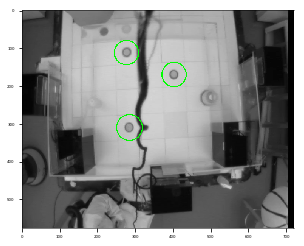

Are all sandwells correct - y/n?y
3 Wells correctly detected


In [149]:
#List all files in directory
file_contents = {}
for file in os.listdir(directory_name):
    Animal_ID = file[-25:-20]
    if len(Animal_ID) > 0:
    
        session = file[-19:-16]
        stage = file[-11:-8]
        if session not in file_contents:
            file_contents[session] = {}
        if stage not in file_contents[session]:
            file_contents[session][stage] = []
            file_contents[session][stage].append(os.path.join(directory_name, file))
        elif session in file_contents and stage in file_contents[session]:
            file_contents[session][stage].append(os.path.join(directory_name, file))
file_contents = {Animal_ID:file_contents}

# for animal, sessions in file_contents.items():
#     for session, stages in sessions.items():
#         for stage, files in stages.items():
#             trace_behav_sync(directory_name, output_directory,file_contents,animal,session,stage)


# Call data_sync function to get data-set
trace_dlc, door_frame_vid, events_dlc = preprocessing_ea_old.trace_behav_sync(directory_name, output_directory,file_contents,'H0466','N01','CHO')


In [150]:
# Remove unnecessary plotting (need to generalise better)
trace_dlc = trace_dlc.iloc[door_frame_vid:]
trace_dlc = trace_dlc[trace_dlc['likelihood']>0.9]
trace_start_box = trace_dlc[trace_dlc['position']==12]
trace_sw1 = trace_dlc[trace_dlc['position']==1]
trace_sw2 = trace_dlc[trace_dlc['position']==2]
trace_sw3 = trace_dlc[trace_dlc['position']==3]

events_dlc = events_dlc.iloc[door_frame_vid:]
events_dlc = events_dlc[events_dlc['likelihood']>0.9]
events_start_box = events_dlc[events_dlc['position']==12]
events_sw1 = events_dlc[events_dlc['position']==1]
events_sw2 = events_dlc[events_dlc['position']==2]
events_sw3 = events_dlc[events_dlc['position']==3]

 C0


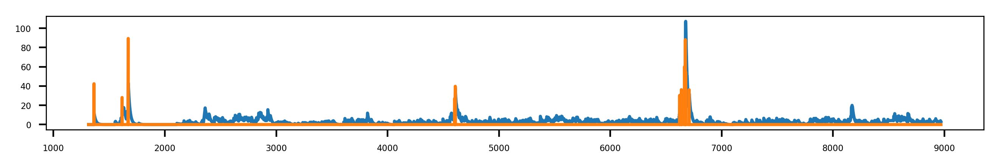

Are all events good - y/n?y
 C1


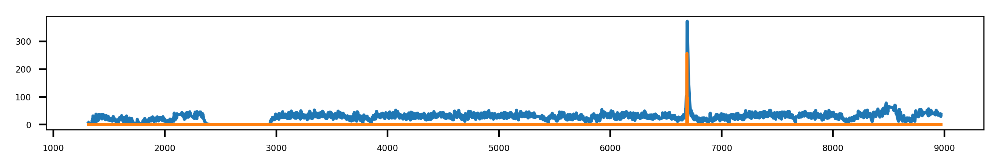

Are all events good - y/n?y
 C10


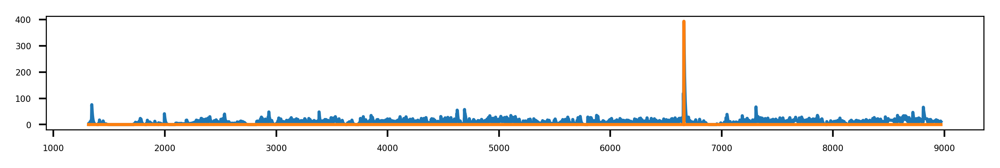

Are all events good - y/n?y
 C100


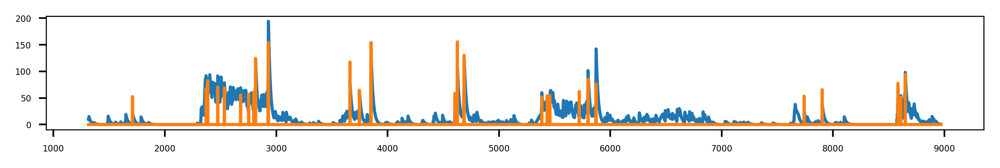

Are all events good - y/n?y
 C101


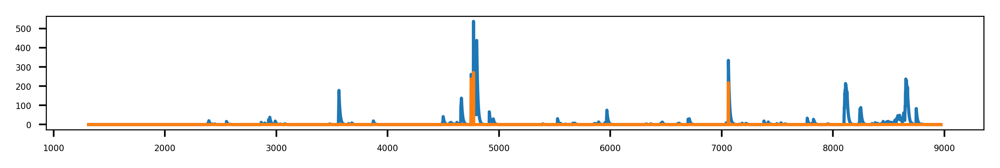

Are all events good - y/n?y
 C102


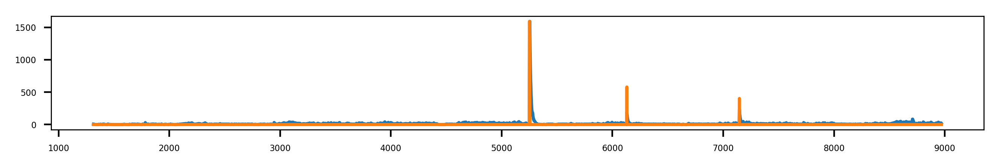

Are all events good - y/n?y
 C103


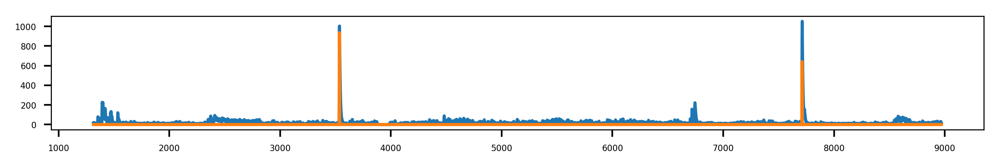

Are all events good - y/n?y
 C104


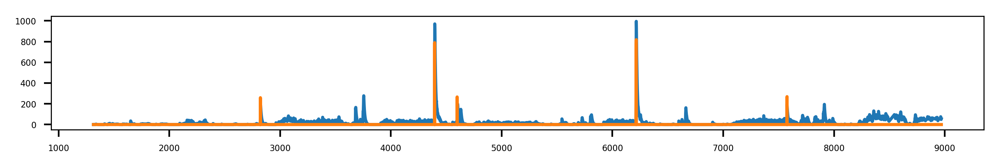

Are all events good - y/n?y
 C105


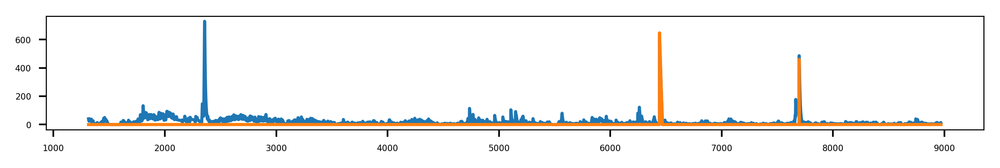

Are all events good - y/n?y
 C106


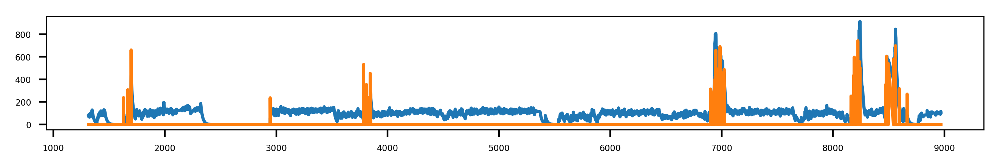

Are all events good - y/n?y
 C107


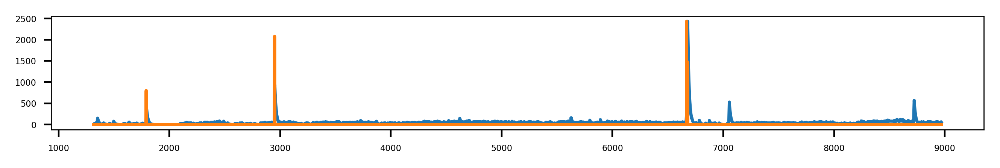

Are all events good - y/n?y
 C108


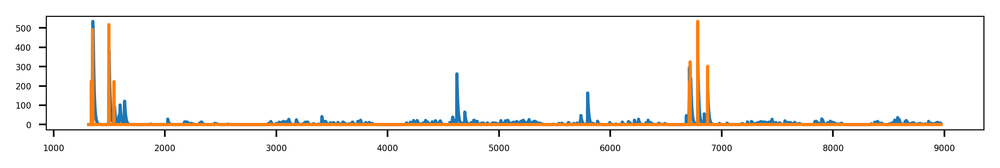

Are all events good - y/n?y
 C109


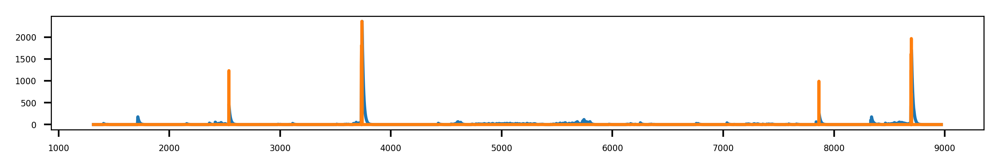

Are all events good - y/n?
cell   C109 has been dropped
 C11


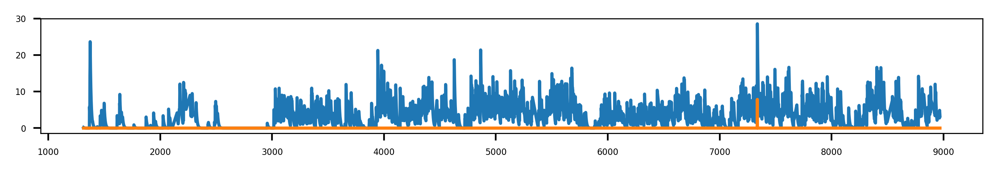

Are all events good - y/n?y
 C110


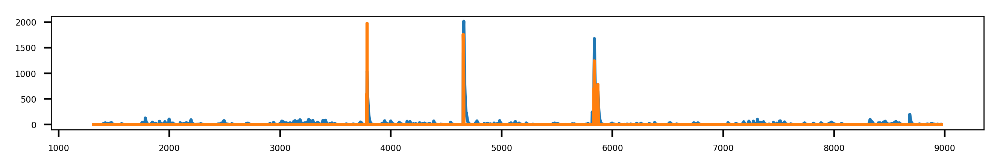

Are all events good - y/n?
cell   C110 has been dropped
 C111


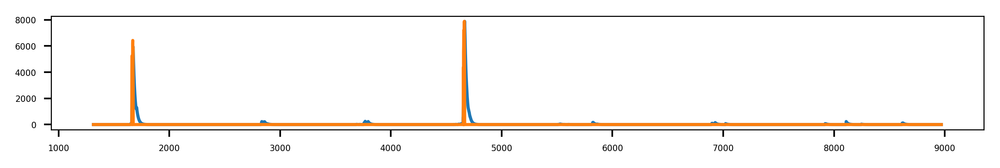

Are all events good - y/n?y
 C112


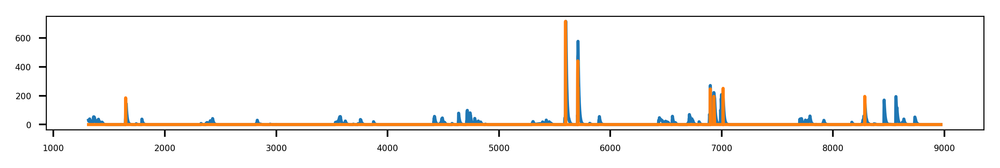

Are all events good - y/n?y
 C113


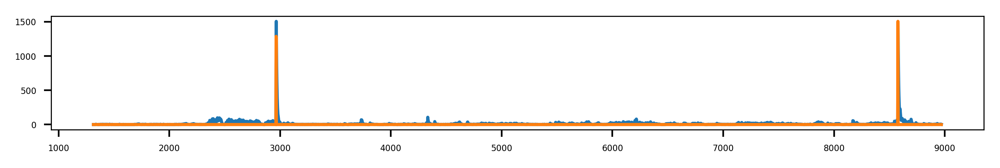

Are all events good - y/n?y
 C114


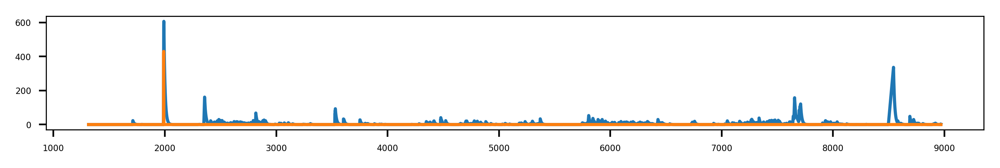

Are all events good - y/n?
cell   C114 has been dropped
 C115


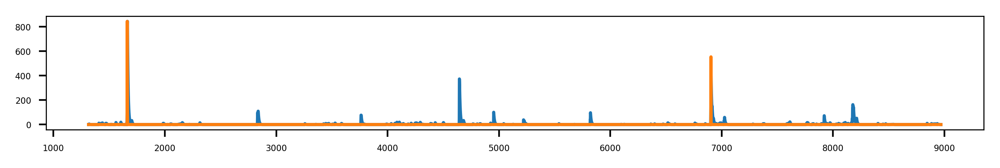

Are all events good - y/n?
cell   C115 has been dropped
 C116


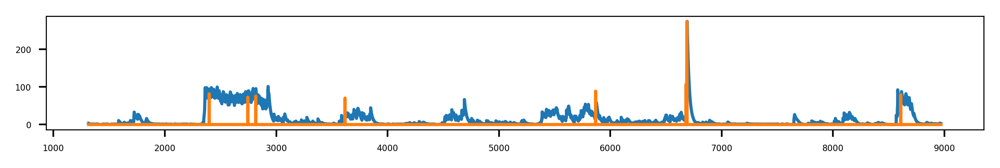

Are all events good - y/n?
cell   C116 has been dropped
 C117


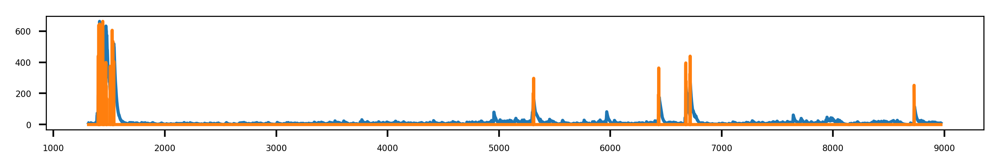

Are all events good - y/n?
cell   C117 has been dropped
 C118


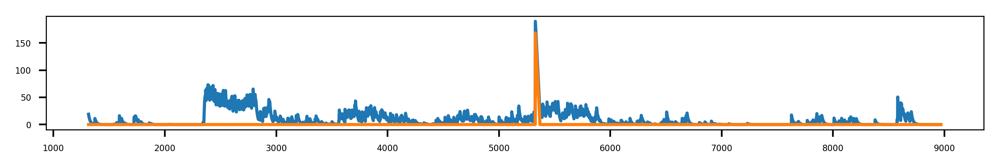

Are all events good - y/n?
cell   C118 has been dropped
 C119


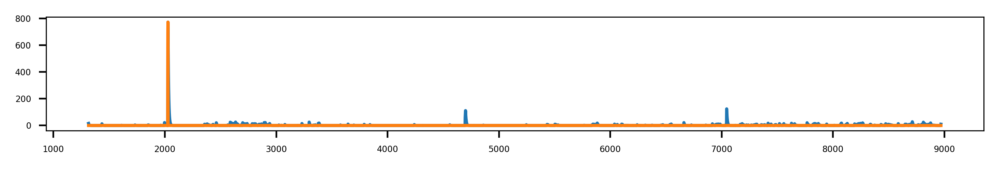

Are all events good - y/n?
cell   C119 has been dropped
 C12


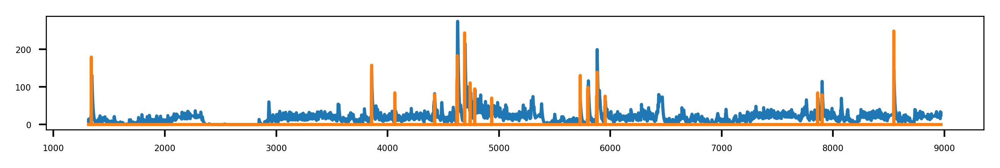

Are all events good - y/n?
cell   C12 has been dropped
 C120


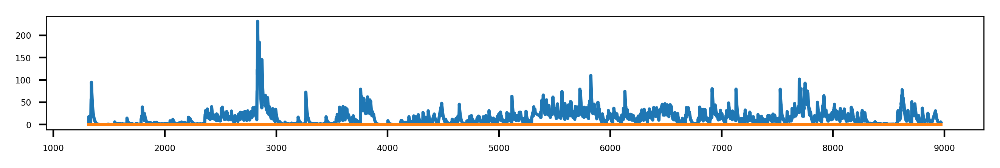

Are all events good - y/n?y
 C121


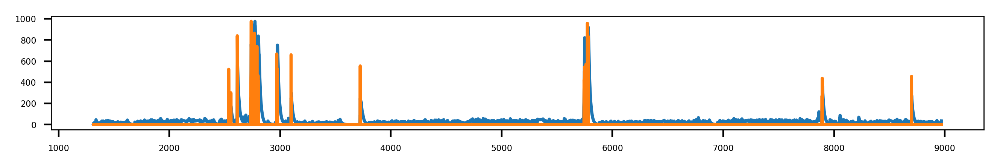

Are all events good - y/n?
cell   C121 has been dropped
 C122


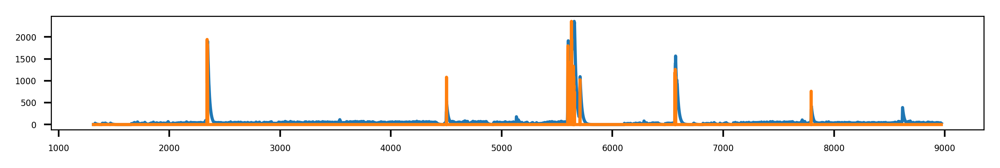

Are all events good - y/n?
cell   C122 has been dropped
 C123


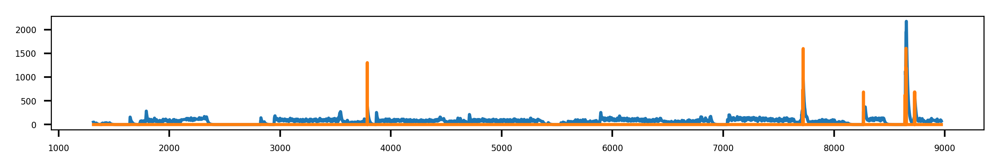

Are all events good - y/n?
cell   C123 has been dropped
 C124


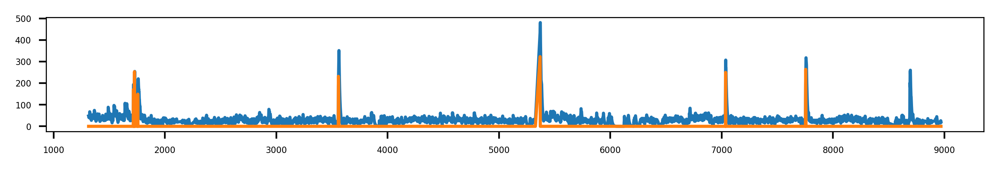

Are all events good - y/n?y
 C125


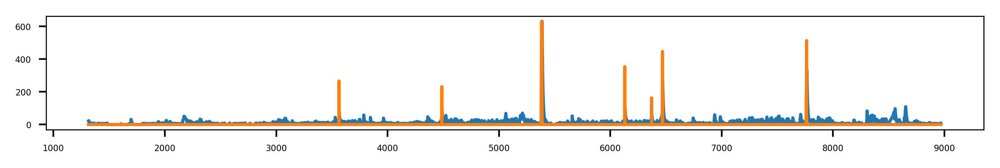

Are all events good - y/n?
cell   C125 has been dropped
 C126


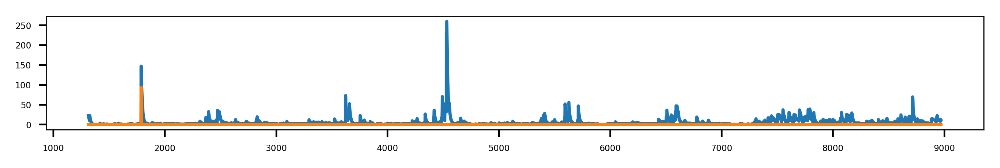

Are all events good - y/n?
cell   C126 has been dropped
 C127


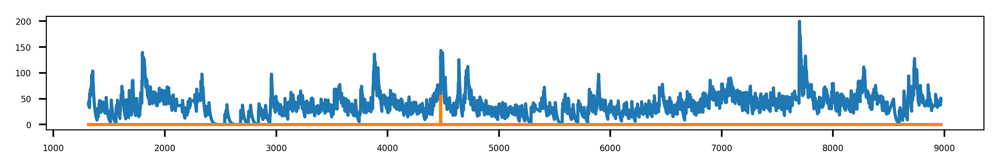

Are all events good - y/n?
cell   C127 has been dropped
 C128


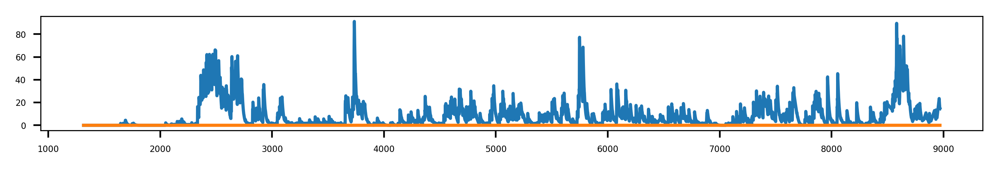

Are all events good - y/n?y
 C129


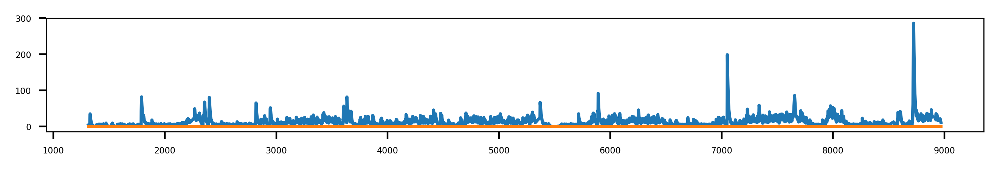

Are all events good - y/n?
cell   C129 has been dropped
 C13


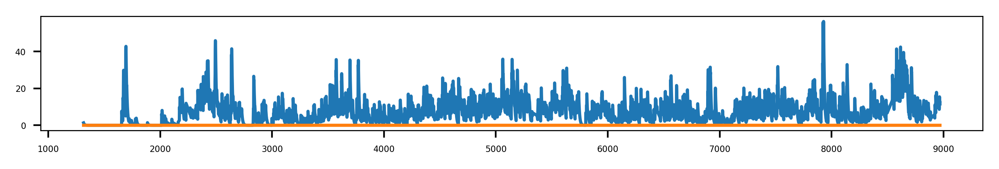

Are all events good - y/n?y
 C130


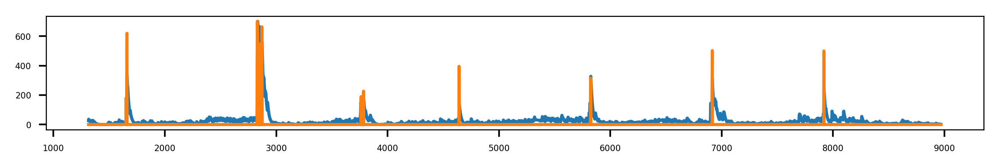

Are all events good - y/n?y
 C131


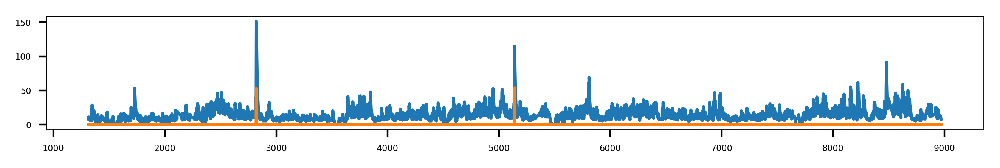

Are all events good - y/n?y
 C132


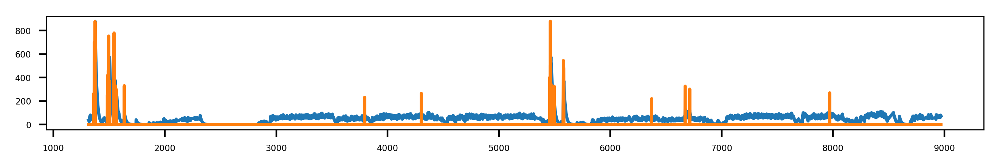

Are all events good - y/n?y
 C133


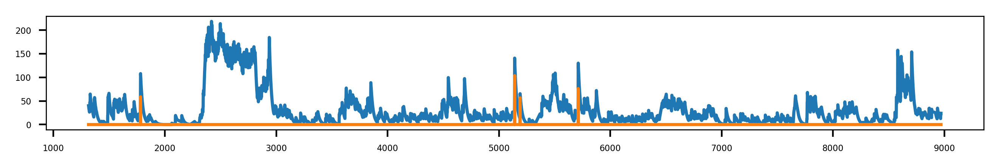

Are all events good - y/n?
cell   C133 has been dropped
 C134


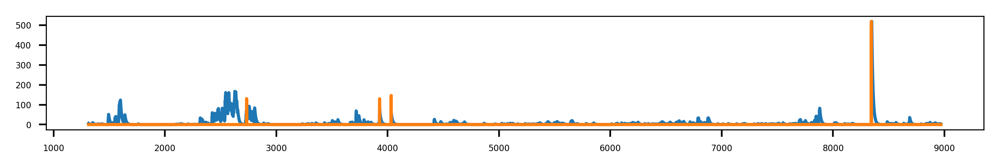

Are all events good - y/n?y
 C135


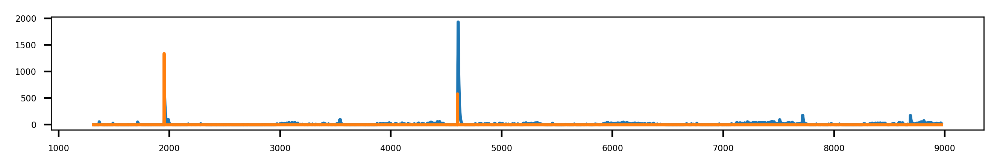

Are all events good - y/n?
cell   C135 has been dropped
 C136


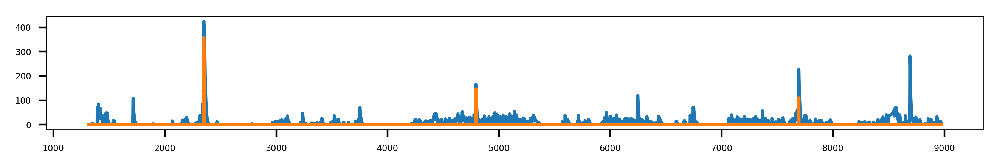

Are all events good - y/n?y
 C137


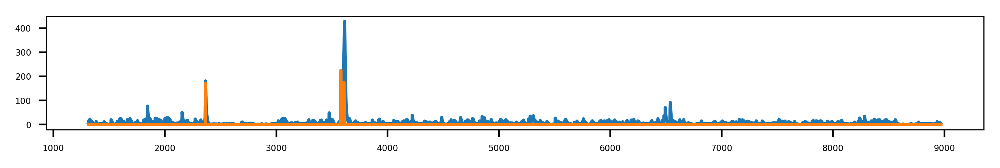

Are all events good - y/n?
cell   C137 has been dropped
 C138


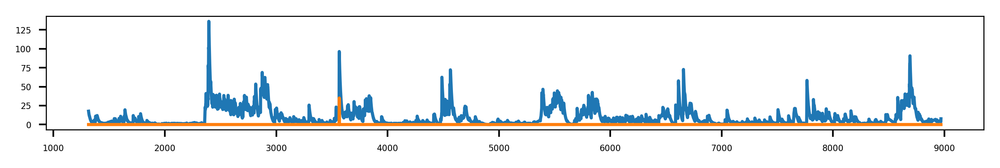

Are all events good - y/n?y
 C139


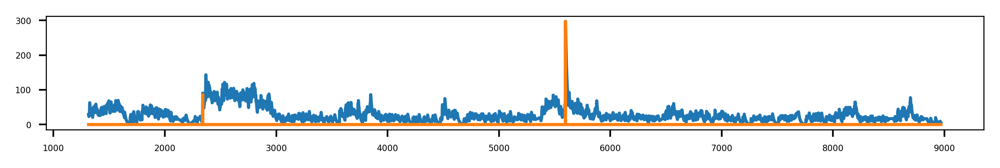

Are all events good - y/n?y
 C14


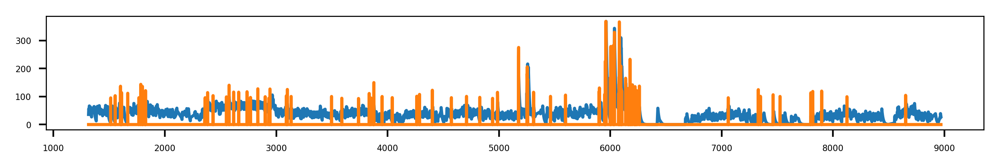

Are all events good - y/n?y
 C140


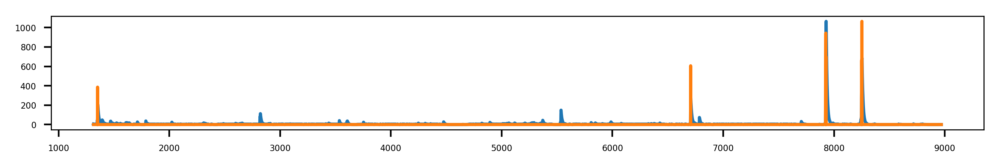

Are all events good - y/n?y
 C141


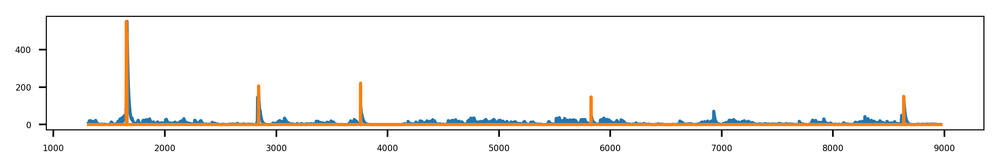

Are all events good - y/n?
cell   C141 has been dropped
 C142


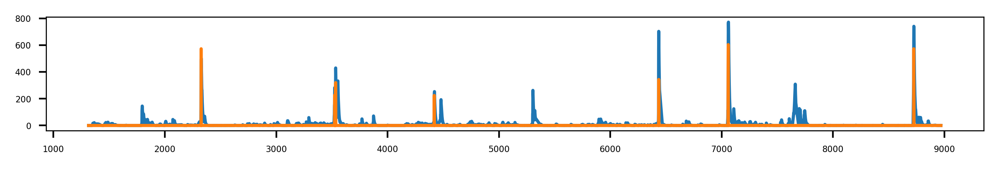

Are all events good - y/n?y
 C143


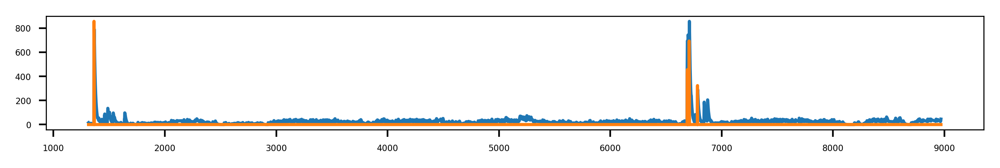

Are all events good - y/n?
cell   C143 has been dropped
 C144


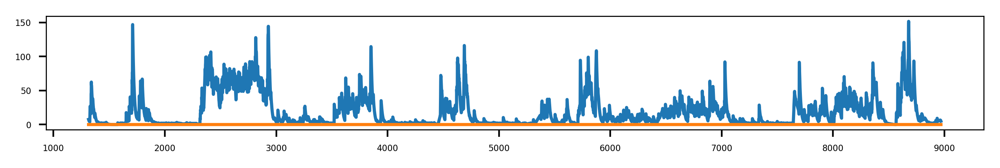

Are all events good - y/n?y
 C145


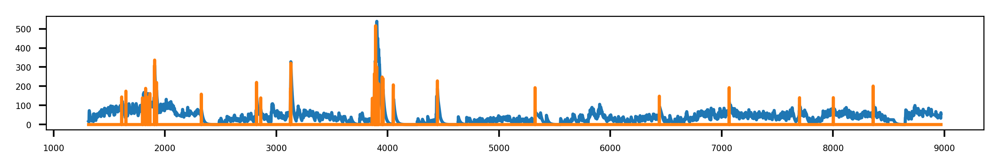

Are all events good - y/n?y
 C146


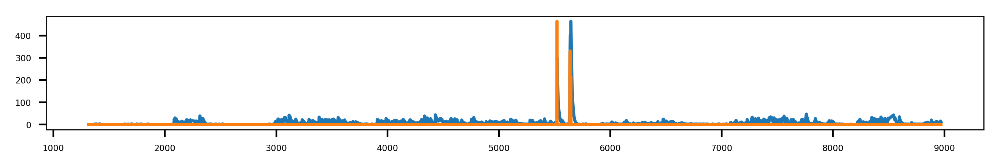

Are all events good - y/n?
cell   C146 has been dropped
 C147


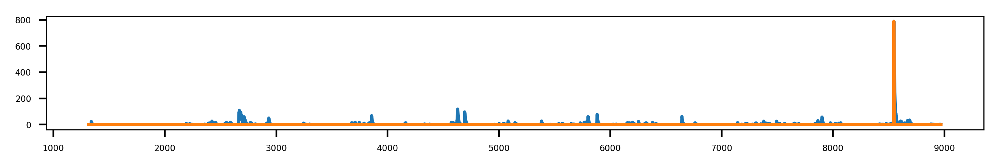

Are all events good - y/n?
cell   C147 has been dropped
 C148


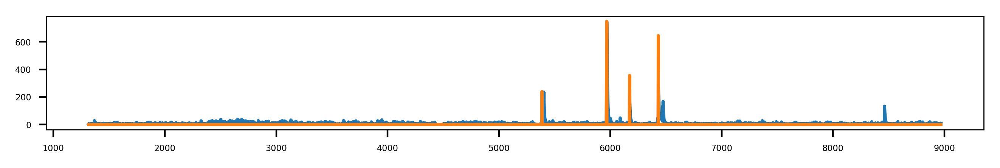

Are all events good - y/n?y
 C149


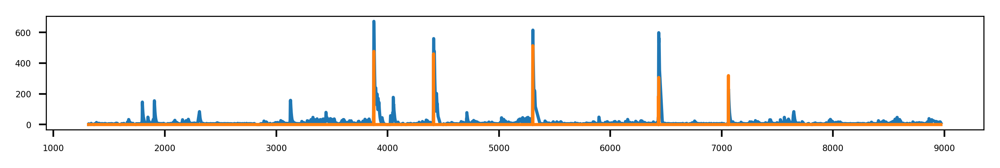

Are all events good - y/n?
cell   C149 has been dropped
 C15


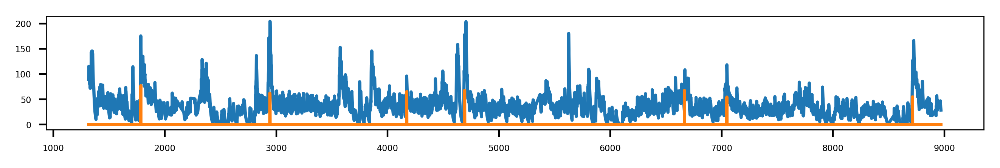

Are all events good - y/n?yy
cell   C15 has been dropped
 C150


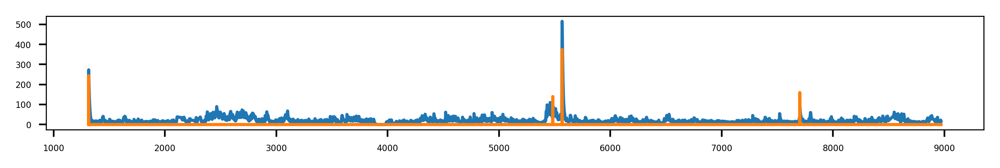

Are all events good - y/n?
cell   C150 has been dropped
 C151


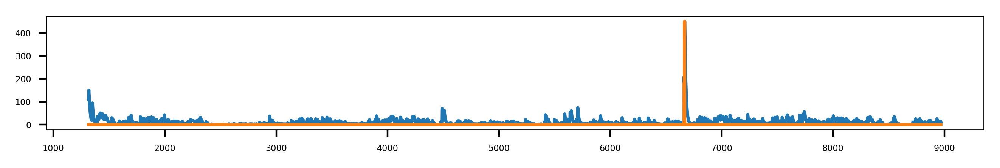

Are all events good - y/n?y
 C152


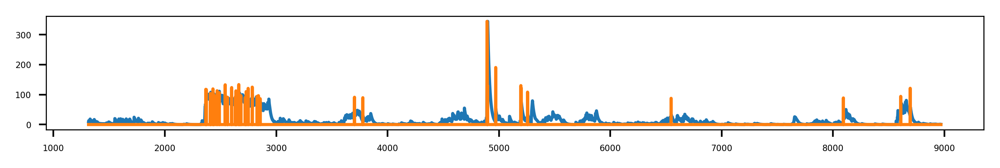

Are all events good - y/n?y
 C153


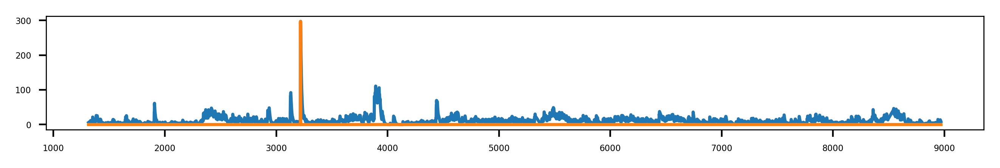

Are all events good - y/n?y
 C154


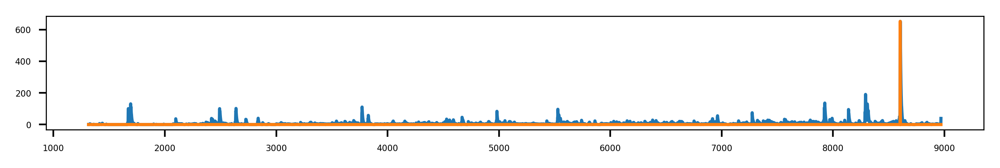

Are all events good - y/n?
cell   C154 has been dropped
 C155


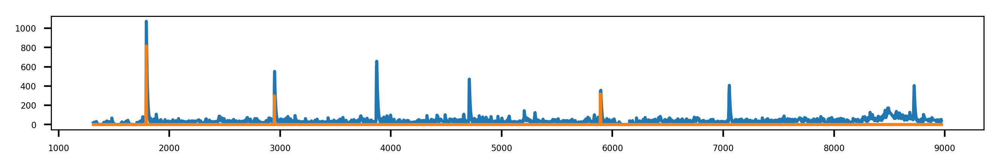

Are all events good - y/n?
cell   C155 has been dropped
 C16


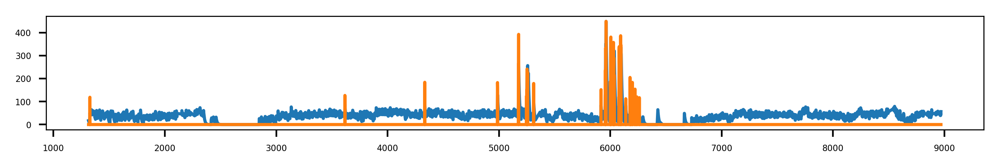

Are all events good - y/n?
cell   C16 has been dropped
 C17


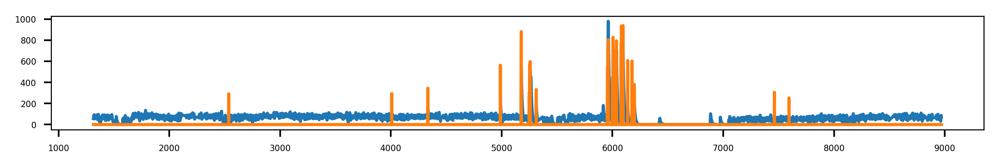

Are all events good - y/n?
cell   C17 has been dropped
 C18


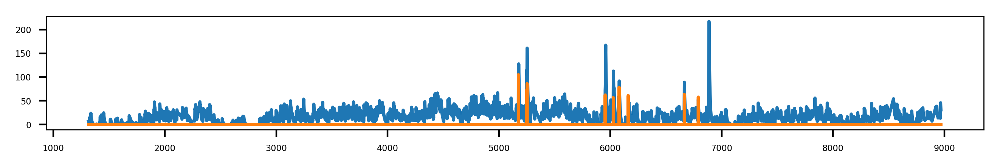

Are all events good - y/n?
cell   C18 has been dropped
 C19


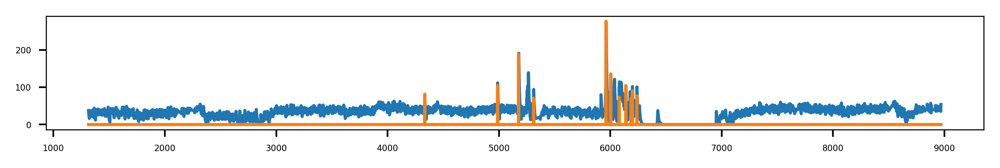

Are all events good - y/n?
cell   C19 has been dropped
 C2


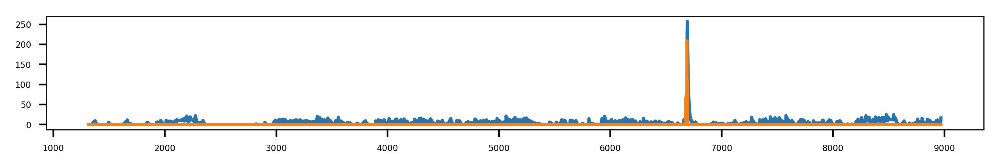

Are all events good - y/n?
cell   C2 has been dropped
 C20


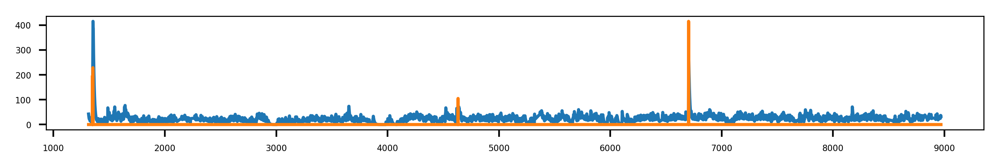

Are all events good - y/n?
cell   C20 has been dropped
 C21


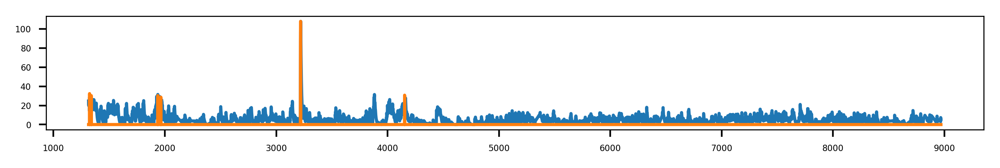

Are all events good - y/n?y
 C22


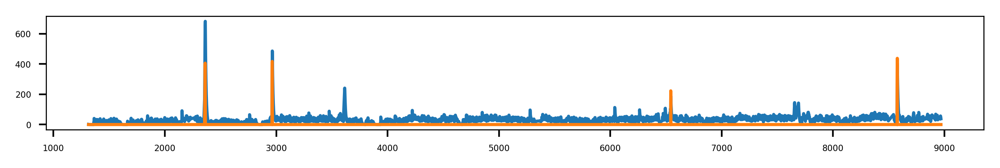

Are all events good - y/n?
cell   C22 has been dropped
 C23


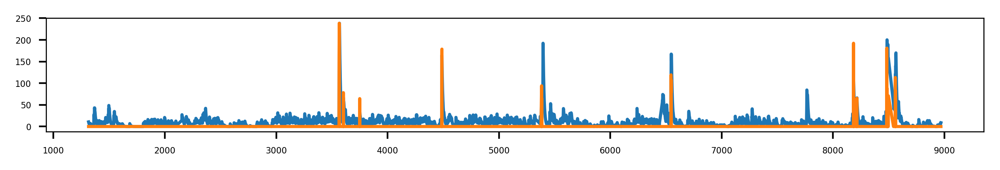

Are all events good - y/n?
cell   C23 has been dropped
 C24


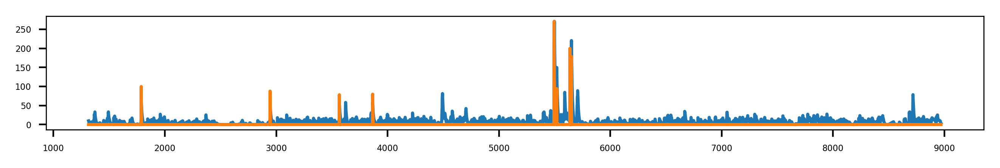

Are all events good - y/n?
cell   C24 has been dropped
 C25


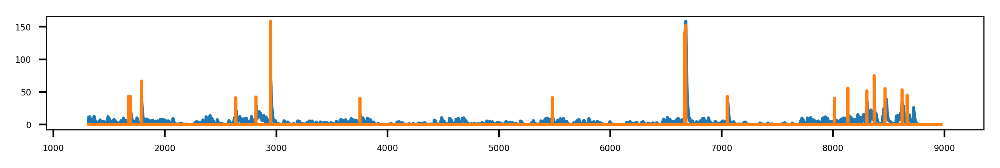

Are all events good - y/n?
cell   C25 has been dropped
 C26


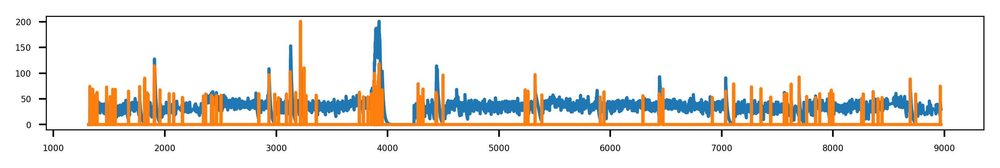

Are all events good - y/n?
cell   C26 has been dropped
 C27


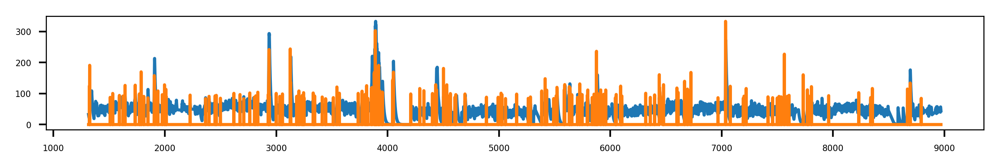

Are all events good - y/n?y
 C28


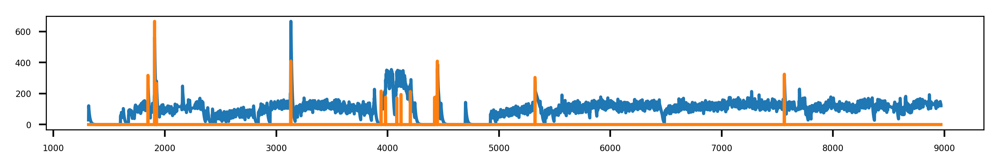

Are all events good - y/n?y
 C29


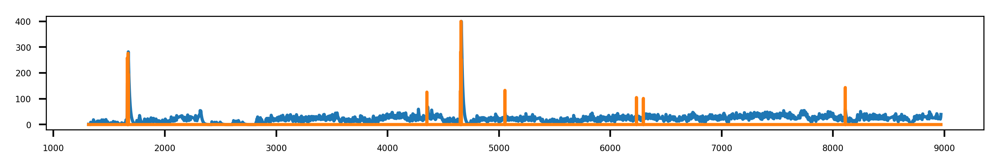

Are all events good - y/n?y
 C3


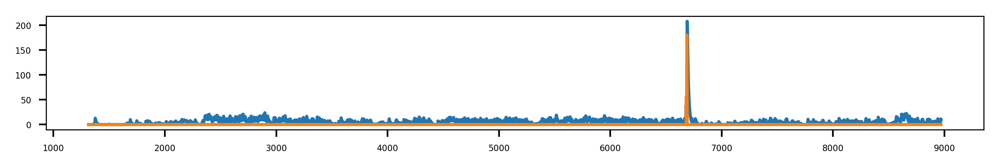

Are all events good - y/n?y
 C30


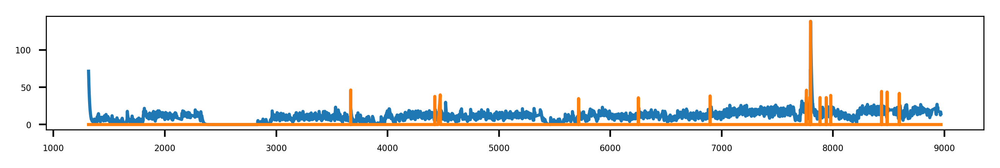

Are all events good - y/n?y
 C31


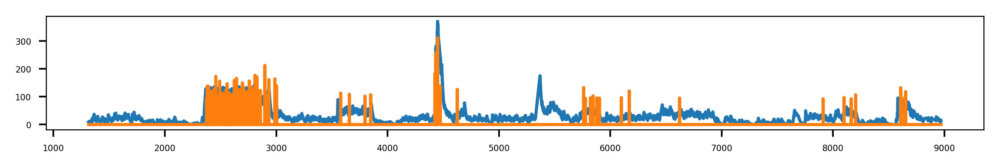

Are all events good - y/n?
cell   C31 has been dropped
 C32


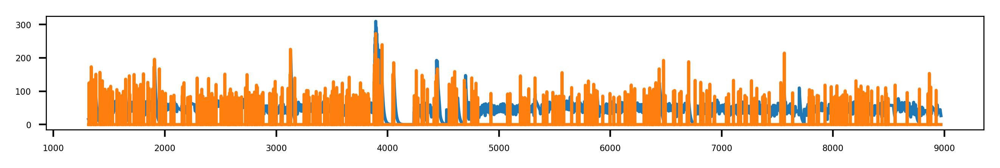

Are all events good - y/n?
cell   C32 has been dropped
 C33


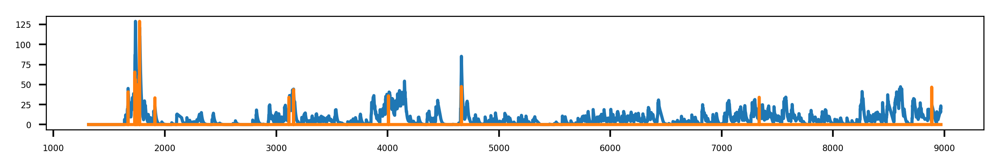

Are all events good - y/n?
cell   C33 has been dropped
 C34


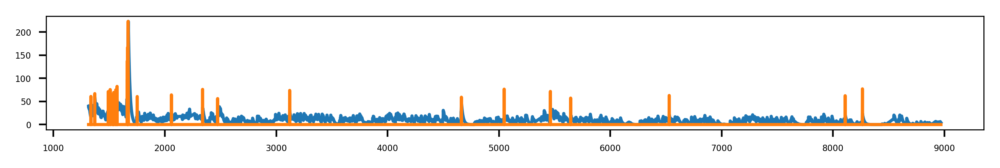

Are all events good - y/n?
cell   C34 has been dropped
 C35


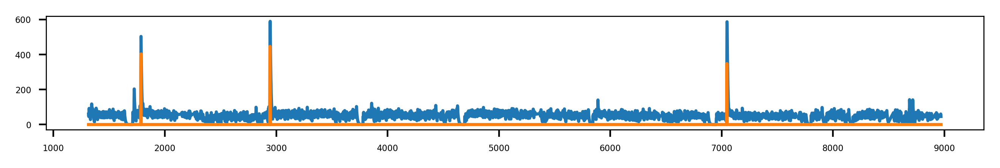

Are all events good - y/n?
cell   C35 has been dropped
 C36


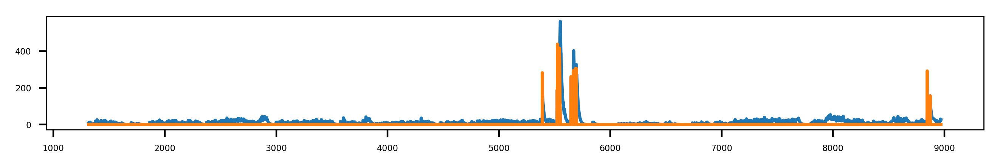

Are all events good - y/n?y
 C37


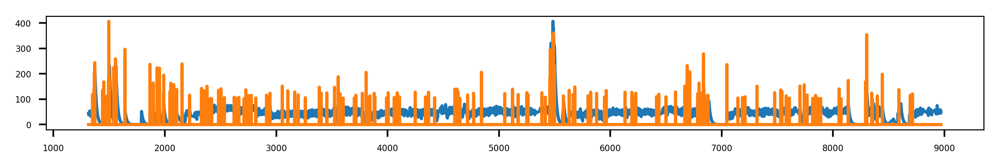

Are all events good - y/n?y
 C38


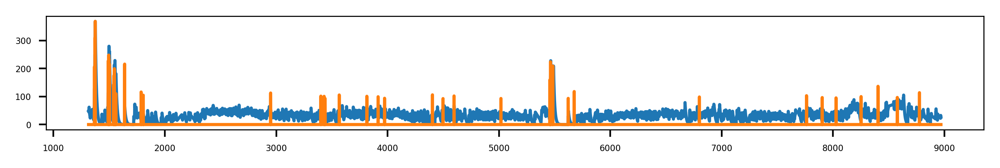

Are all events good - y/n?
cell   C38 has been dropped
 C39


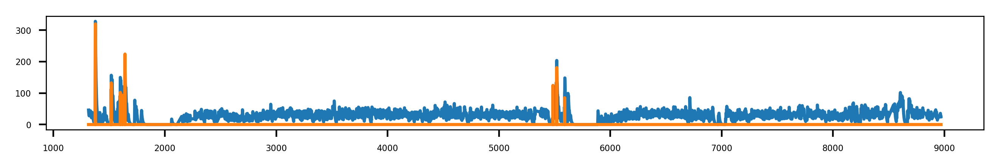

Are all events good - y/n?
cell   C39 has been dropped
 C4


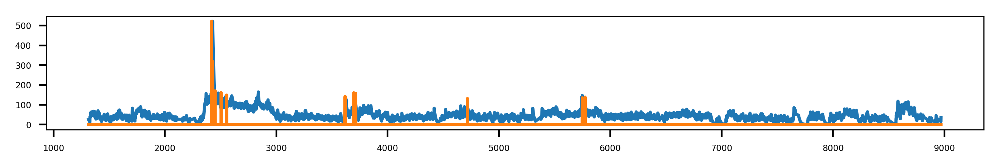

Are all events good - y/n?
cell   C4 has been dropped
 C40


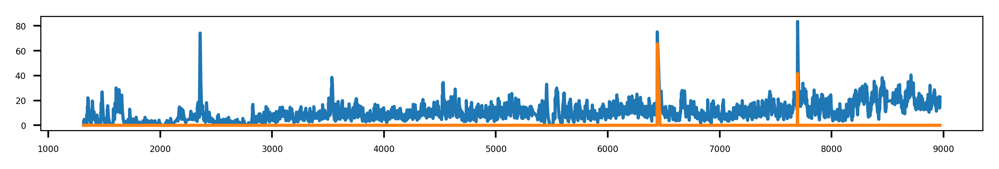

Are all events good - y/n?
cell   C40 has been dropped
 C41


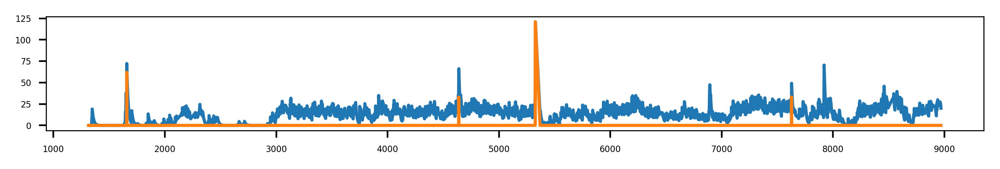

Are all events good - y/n?y
 C42


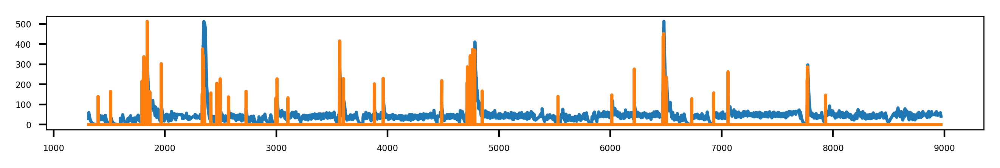

Are all events good - y/n?y
 C43


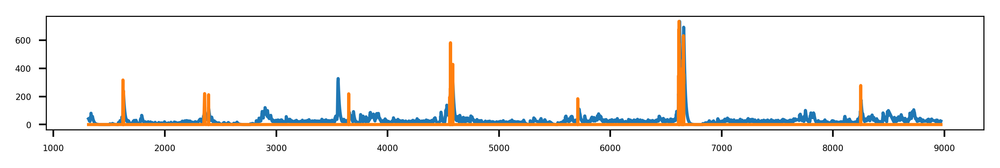

Are all events good - y/n?
cell   C43 has been dropped
 C44


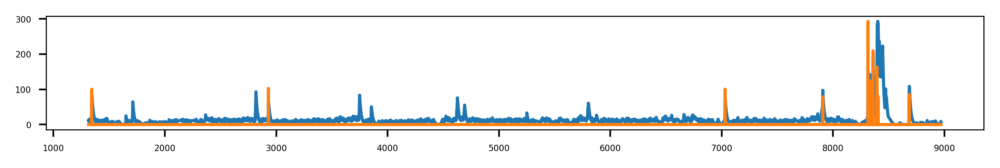

Are all events good - y/n?
cell   C44 has been dropped
 C45


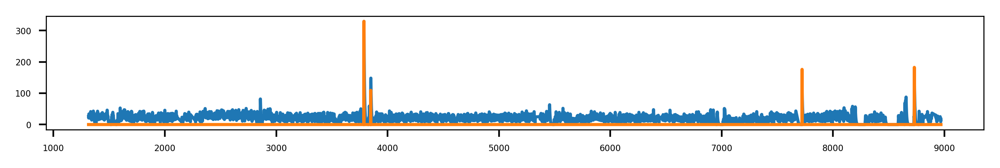

Are all events good - y/n?y
 C46


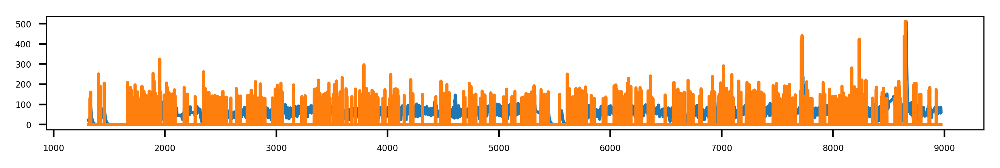

Are all events good - y/n?
cell   C46 has been dropped
 C47


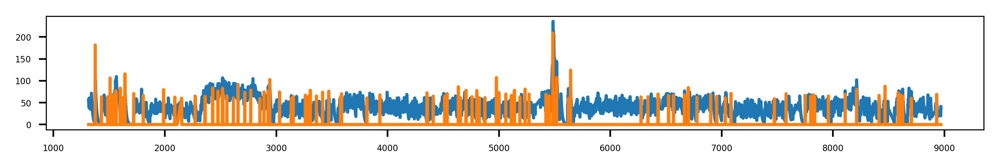

Are all events good - y/n?
cell   C47 has been dropped
 C48


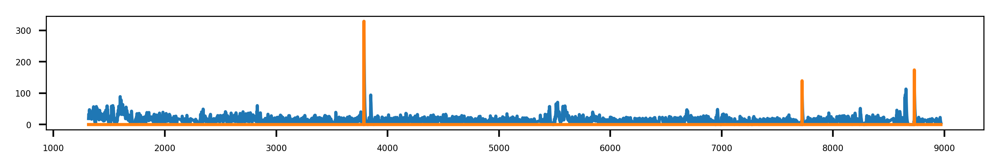

Are all events good - y/n?
cell   C48 has been dropped
 C49


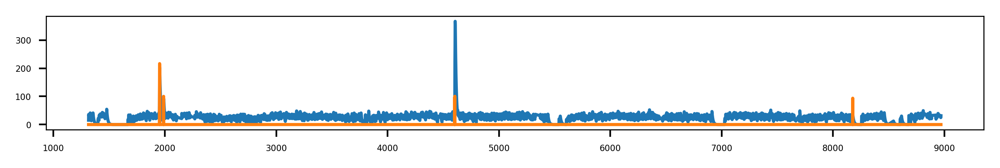

Are all events good - y/n?
cell   C49 has been dropped
 C5


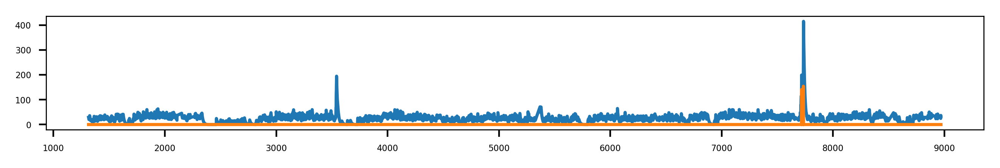

Are all events good - y/n?
cell   C5 has been dropped
 C50


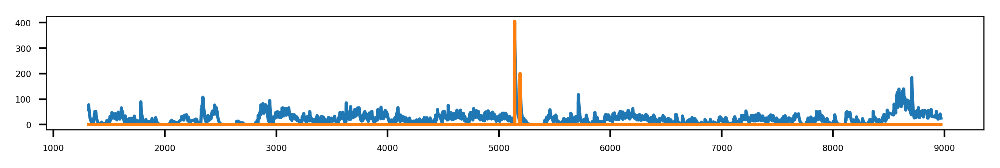

Are all events good - y/n?
cell   C50 has been dropped
 C51


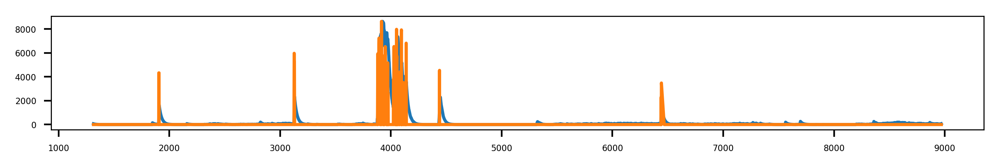

Are all events good - y/n?
cell   C51 has been dropped
 C52


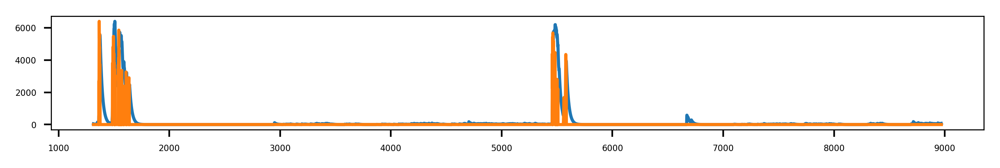

Are all events good - y/n?
cell   C52 has been dropped
 C53


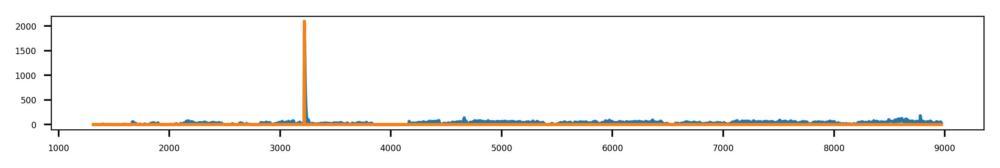

Are all events good - y/n?
cell   C53 has been dropped
 C54


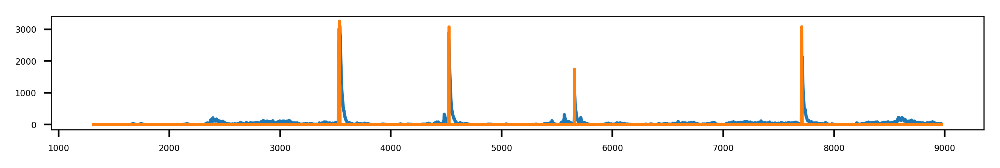

Are all events good - y/n?
cell   C54 has been dropped
 C55


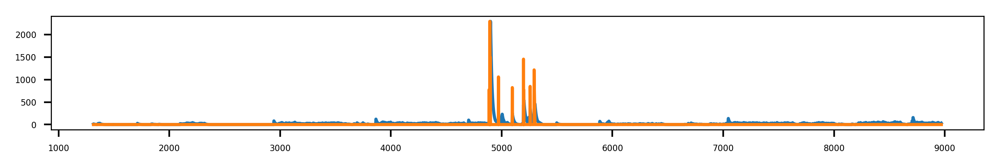

Are all events good - y/n?
cell   C55 has been dropped
 C56


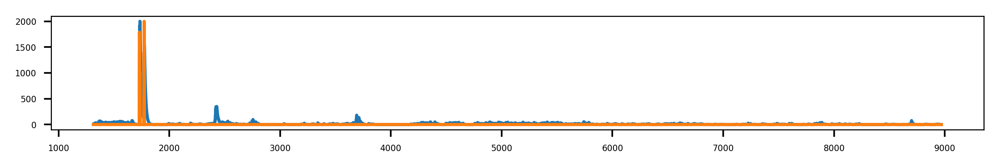

Are all events good - y/n?
cell   C56 has been dropped
 C57


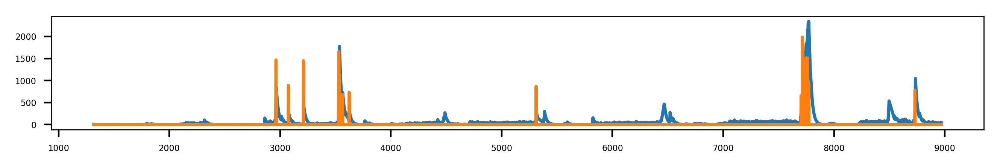

Are all events good - y/n?
cell   C57 has been dropped
 C58


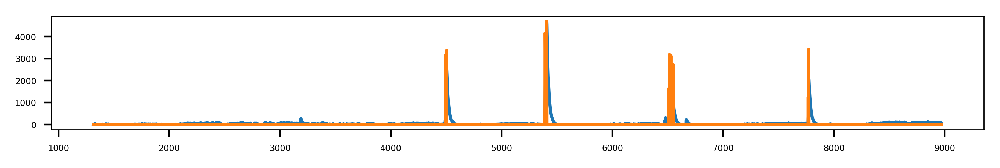

Are all events good - y/n?
cell   C58 has been dropped
 C59


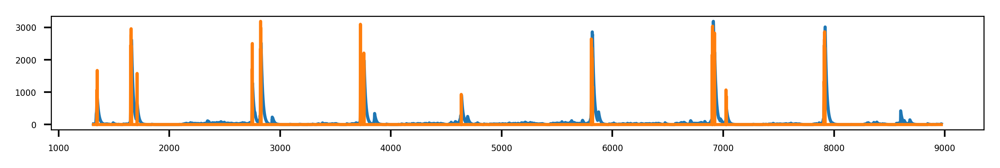

Are all events good - y/n?
cell   C59 has been dropped
 C6


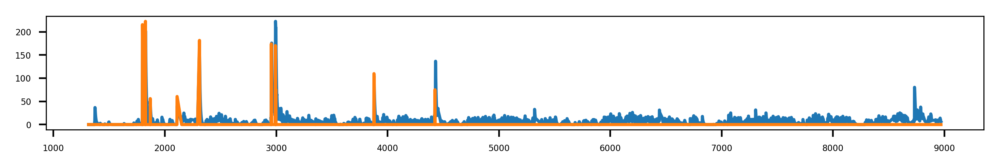

Are all events good - y/n?
cell   C6 has been dropped
 C60


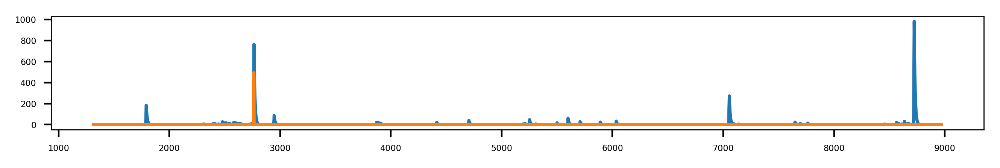

Are all events good - y/n?
cell   C60 has been dropped
 C61


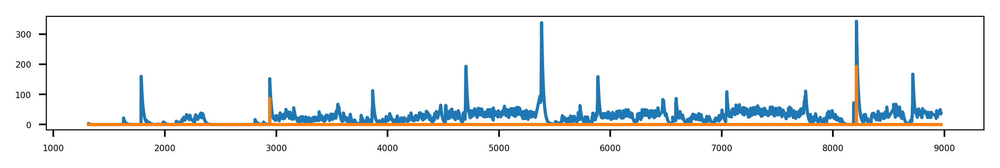

Are all events good - y/n?
cell   C61 has been dropped
 C62


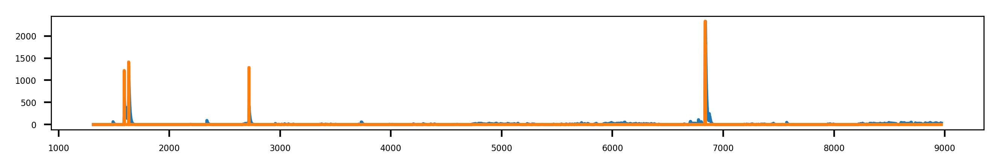

Are all events good - y/n?
cell   C62 has been dropped
 C63


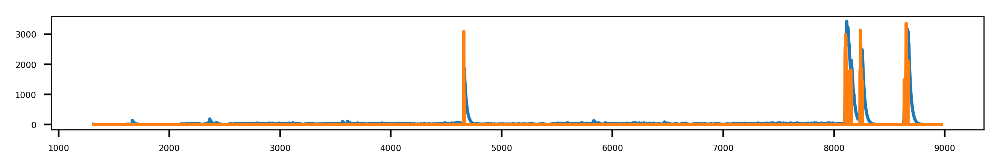

Are all events good - y/n?y
 C64


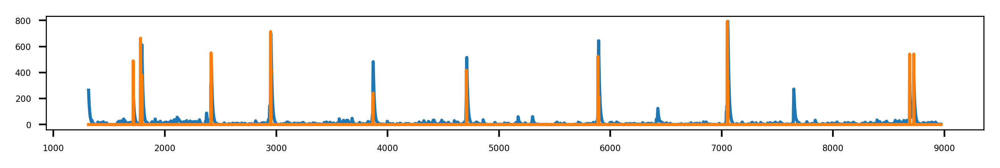

Are all events good - y/n?
cell   C64 has been dropped
 C65


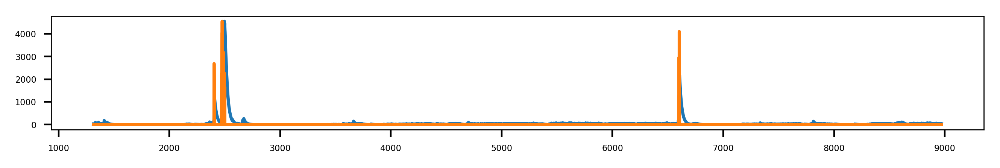

Are all events good - y/n?
cell   C65 has been dropped
 C66


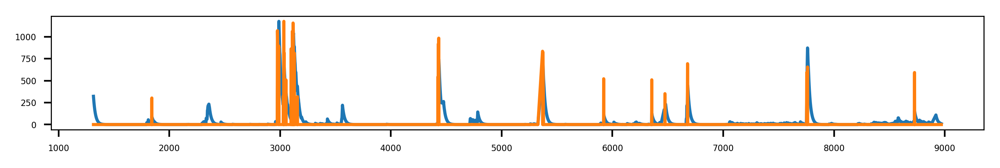

Are all events good - y/n?
cell   C66 has been dropped
 C67


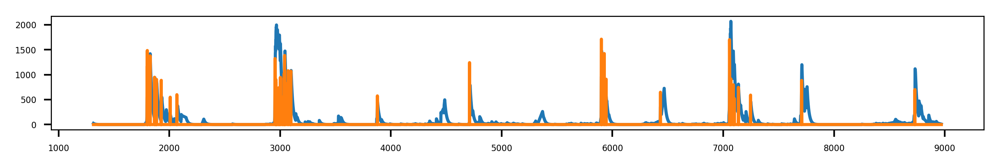

Are all events good - y/n?
cell   C67 has been dropped
 C68


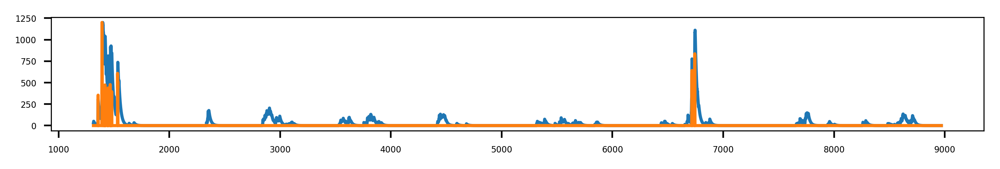

Are all events good - y/n?y
 C69


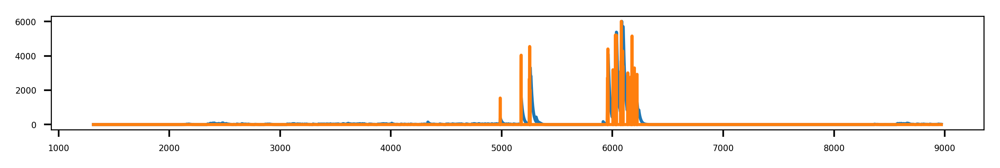

Are all events good - y/n?
cell   C69 has been dropped
 C7


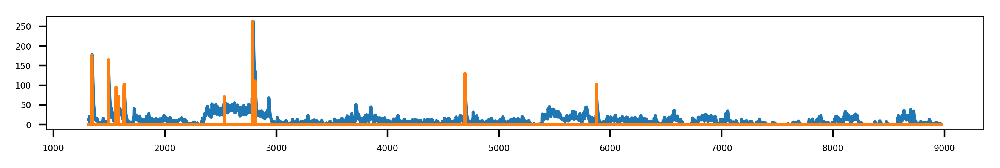

Are all events good - y/n?
cell   C7 has been dropped
 C70


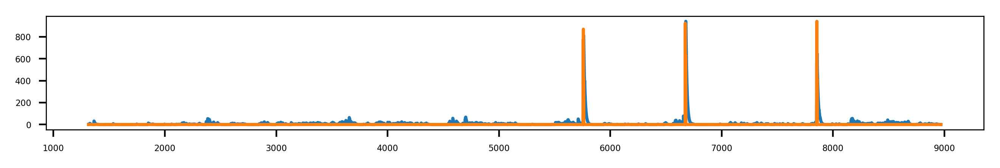

Are all events good - y/n?
cell   C70 has been dropped
 C71


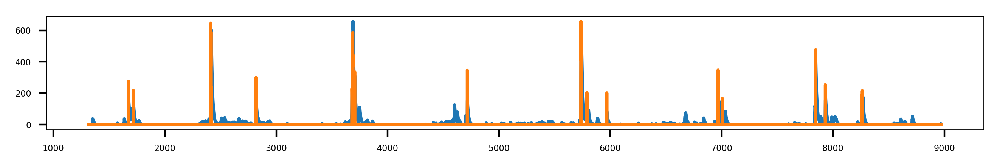

Are all events good - y/n?
cell   C71 has been dropped
 C72


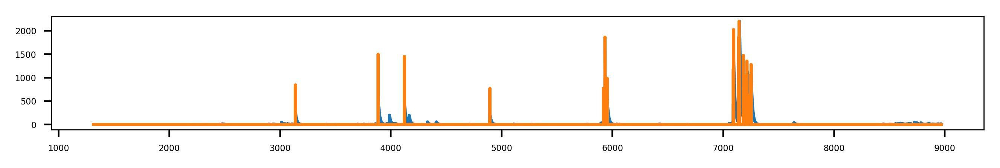

Are all events good - y/n?
cell   C72 has been dropped
 C73


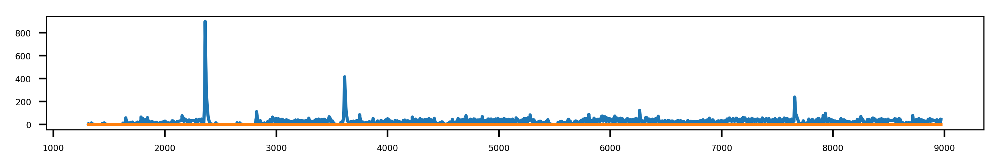

Are all events good - y/n?y
 C74


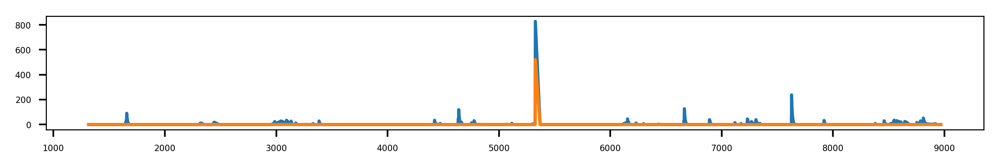

Are all events good - y/n?y
 C75


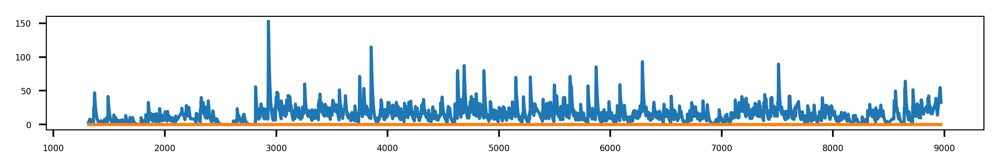

Are all events good - y/n?y
 C76


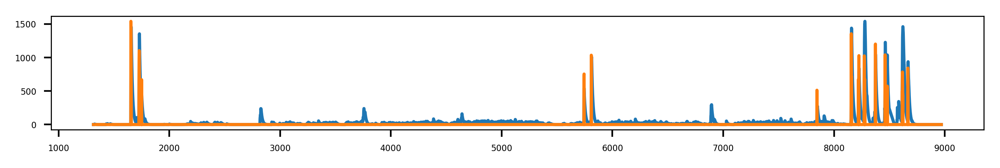

Are all events good - y/n?y
 C77


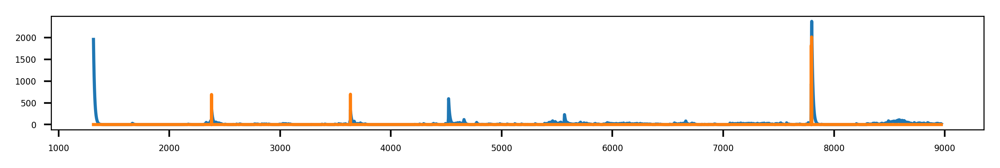

Are all events good - y/n?y
 C78


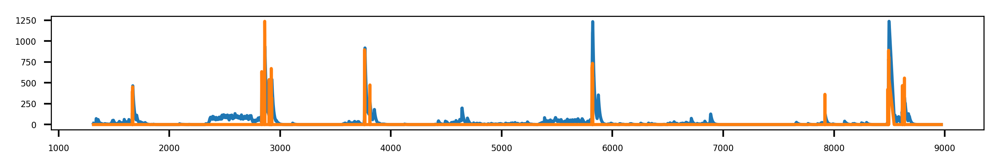

Are all events good - y/n?y
 C79


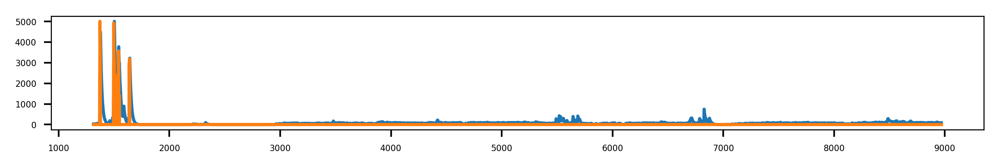

Are all events good - y/n?y
 C8


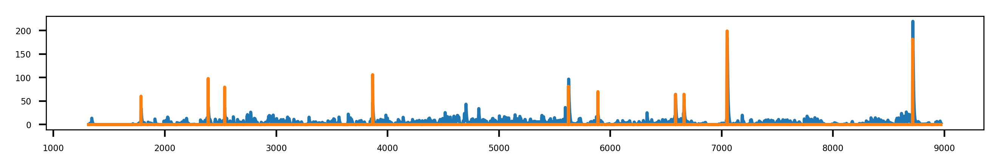

Are all events good - y/n?y
 C80


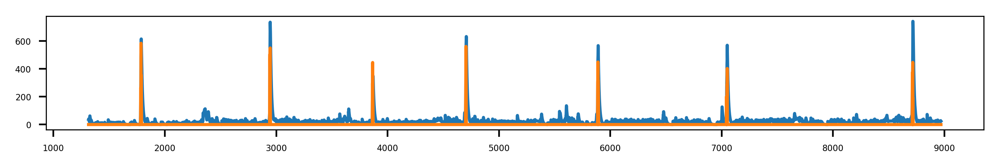

Are all events good - y/n?y
 C81


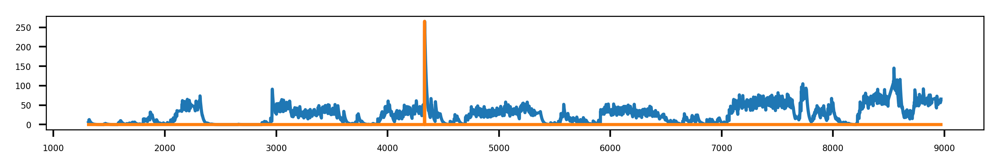

Are all events good - y/n?y
 C82


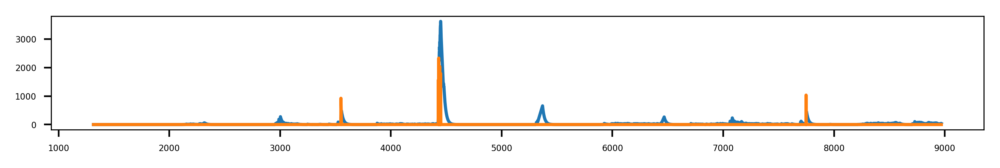

Are all events good - y/n?y
 C83


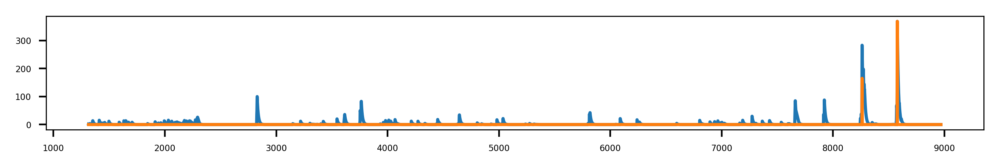

Are all events good - y/n?y
 C84


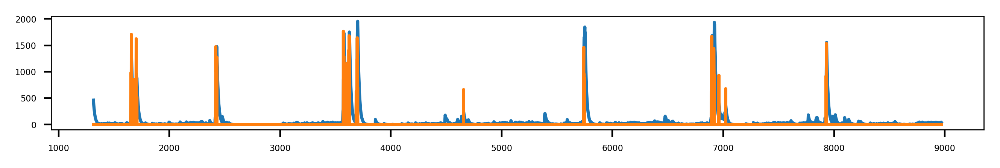

Are all events good - y/n?
cell   C84 has been dropped
 C85


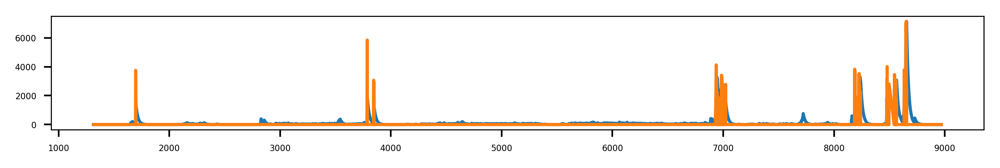

Are all events good - y/n?
cell   C85 has been dropped
 C86


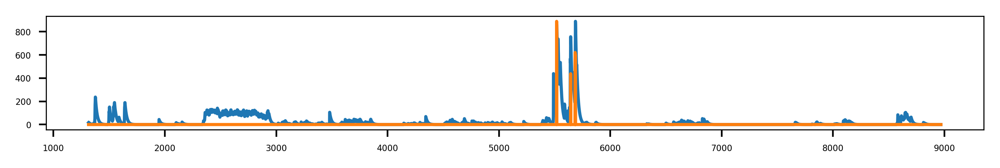

Are all events good - y/n?
cell   C86 has been dropped
 C87


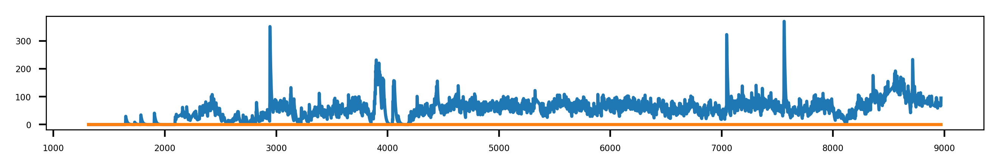

Are all events good - y/n?
cell   C87 has been dropped
 C88


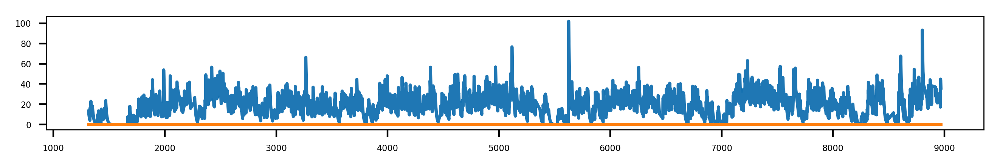

Are all events good - y/n?
cell   C88 has been dropped
 C89


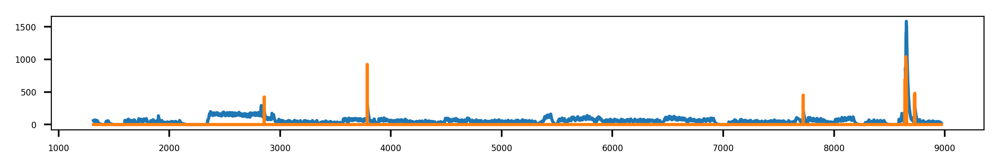

Are all events good - y/n?
cell   C89 has been dropped
 C9


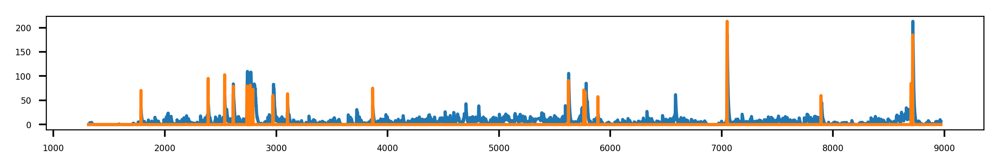

Are all events good - y/n?
cell   C9 has been dropped
 C90


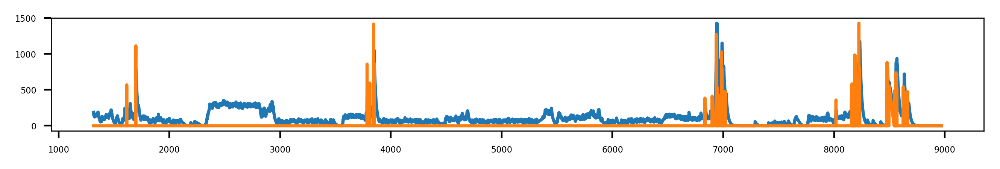

Are all events good - y/n?
cell   C90 has been dropped
 C91


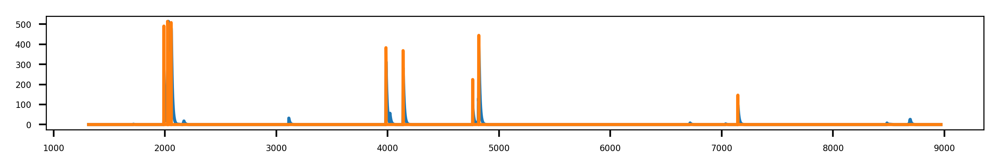

Are all events good - y/n?
cell   C91 has been dropped
 C92


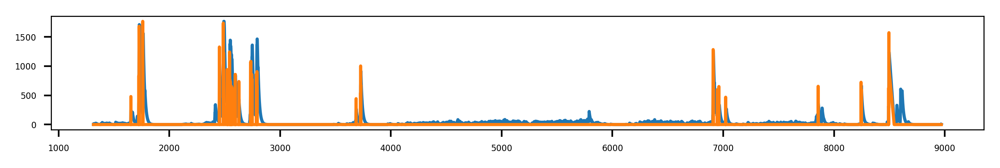

Are all events good - y/n?y
 C93


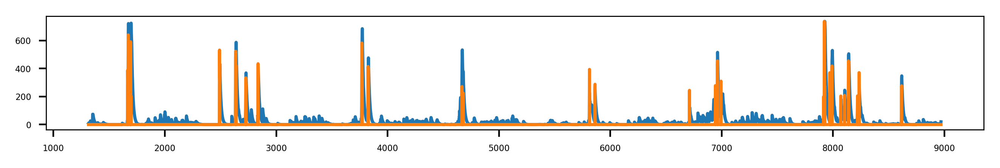

Are all events good - y/n?y
 C94


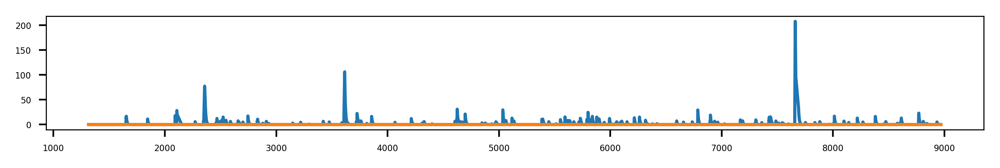

Are all events good - y/n?
cell   C94 has been dropped
 C95


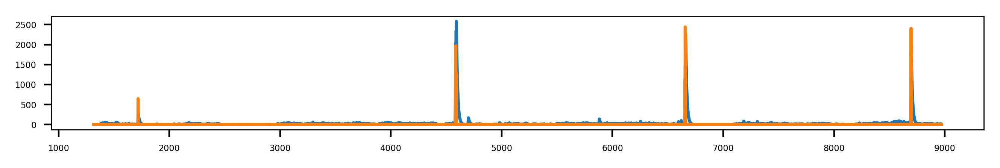

Are all events good - y/n?
cell   C95 has been dropped
 C96


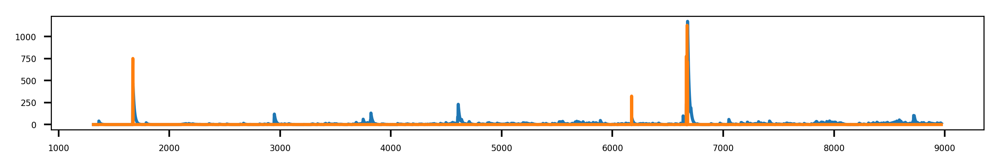

Are all events good - y/n?y
 C97


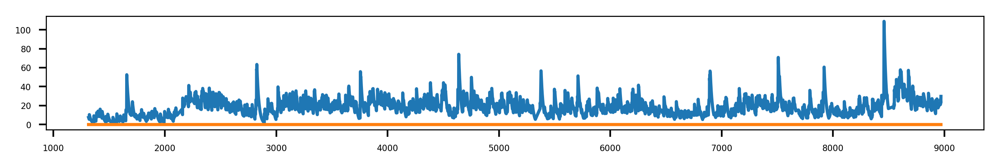

Are all events good - y/n?
cell   C97 has been dropped
 C98


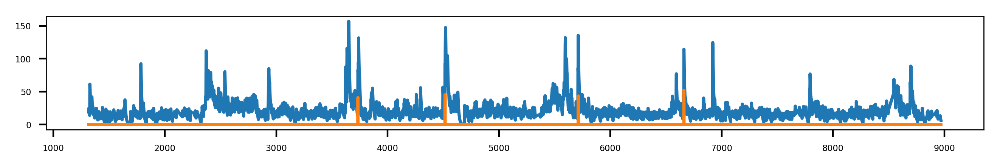

Are all events good - y/n?
cell   C98 has been dropped
 C99


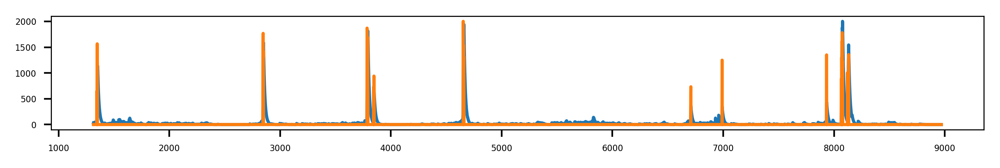

Are all events good - y/n?y


In [151]:
# CRITERIA 1 - Cell sorting to manually remove bad traces
# ----------------------------------------------------------------------------------------
cols = events_dlc.columns[7:]
for cell in cols:
    print(cell)
    plt.figure(figsize=(8, 1), dpi=400)
    plt.plot(trace_dlc[str(cell)])
    plt.plot(events_dlc[str(cell)]*max(trace_dlc[str(cell)]))
    plt.show()
    good_events = input("Are all events good - y/n?")
    if good_events != 'y':
        print('cell ',cell, 'has been dropped')
        trace_dlc = trace_dlc.drop([cell], axis=1)
        events_dlc = events_dlc.drop([cell], axis=1)
        
# Extract data trace and event traces
data_trace = np.array(trace_dlc.iloc[:,7:].astype(float)).transpose()
data_events = np.array(events_dlc.iloc[:,7:].astype(float)).transpose()
behav_vector = np.array(trace_dlc['position'].astype(float))

In [152]:
# CRITERIA 2 - all cells with events lower than 0.3 = 0
cols = events_dlc.columns[7:]
for cell in cols:
    a = np.array(events_dlc[cell].values.tolist())
    events_dlc[cell] = np.where(a <= 0.3, 0, a).tolist() # <--- Condition, ignore events lower than 0.3
    events_dlc[cell] = np.where(a >= 0.3, 1, a).tolist() # <--- Binarize events
    if sum(events_dlc[cell])<3:
        events_dlc = events_dlc.drop([cell], axis=1)

In [153]:
# Bin traces, events and vector (can define bin sze in bnning function if you want)
binned_data_trace = np.nan_to_num(np.array(place_cell_functions.trace_binning(data_trace)))
binned_data_events = np.nan_to_num(np.array(place_cell_functions.spike_binning(data_events)))
binned_behav_vector = np.array(place_cell_functions.behav_vector_binning(behav_vector))

# Test that all data has the same dimensions
if data_trace.shape != data_events.shape:
    raise ValueError(data_trace.shape, data_events.shape,"data_trace and data_events are not the same dimensions")
if binned_data_trace.shape[1] != binned_data_events.shape[1] != binned_behav_vector.shape[0]:
    raise ValueError('Trace=', binned_data_trace.shape, 'events=',binned_data_events.shape, 'vector=',binned_behav_vector.shape, "The dimensions of the binned data do not match")

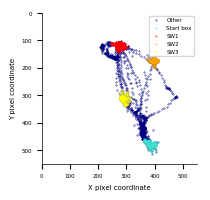

In [154]:
# Sanity check - make sure that DLC trace looks correct
plt.figure(figsize=(2, 2), dpi=100)
plt.scatter(events_dlc['x'], events_dlc['y'], s=0.1, c='navy')
plt.scatter(events_start_box['x'], events_start_box['y'], s=0.1, c='turquoise')
plt.scatter(events_sw1['x'], events_sw1['y'], s=0.1, c='red')
plt.scatter(events_sw2['x'], events_sw2['y'], s=0.1, c='orange')
plt.scatter(events_sw3['x'], events_sw3['y'], s=0.1, c='yellow')
plt.legend(['Other', 'Start box', 'SW1', 'SW2', 'SW3'], loc=0, prop={'size': 4}, shadow=False, scatterpoints=1)
plt.xlim(0,550)
plt.ylim(0,550)
plt.xlabel('X pixel coordinate', fontsize=5)
plt.ylabel('Y pixel coordinate', fontsize=5)
plt.gca().invert_yaxis()
sns.despine()

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide


IndexError: index 40 is out of bounds for axis 0 with size 40

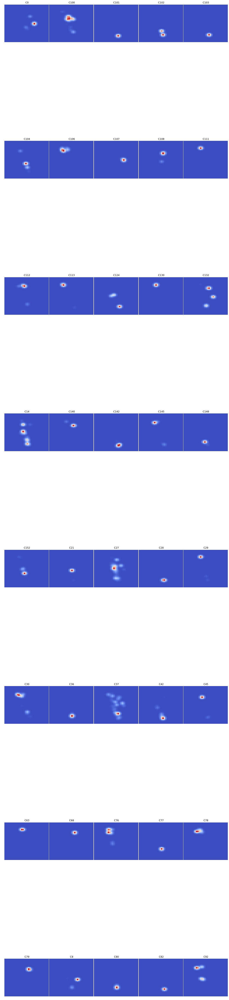

In [166]:
#Plot occupancy maps
cols = events_dlc.columns[7:] # <--- Get all cell names from their columns
place_field_dic = {} # <---- Create dictionary to store all place cells

fig, axs = plt.subplots(int(len(cols)/5),5, figsize=(20, 100), facecolor='w', edgecolor='k', squeeze=False)
fig.subplots_adjust(wspace=0.01, hspace=0.0001)
axs = axs.ravel()

for neuron in range(len(cols)):        
    xedges = np.arange(0, 700, 720/33)
    yedges = np.arange(0, 600, 500/33)

    # Read in x,y coordinates
    x = events_dlc['x']
    y = events_dlc['y']
    
    # Read in correspoding events at each x,y coordinates
    weights = events_dlc[str(cols[neuron])]

    # Create 2D histogram for occupancy and for events
    H, xedges, yedges = np.histogram2d(x, y, bins=(xedges, yedges))
    H = H.T  

    I, xedges, yedges = np.histogram2d(x, y, bins=(xedges, yedges), weights = weights)
    I = I.T
    
    # Normalize events by occupancy and add gaussian filter
    place_field = np.nan_to_num(I/H)
    place_field = gaussian_filter(place_field, sigma=1)
    place_field_dic[cols[neuron]] = place_field

#     # plot place fields (Optional)   
    axs[neuron].imshow(place_field, interpolation='nearest', origin='low',
               extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], cmap='coolwarm')

    axs[neuron].set_title(cols[neuron])
    axs[neuron].axis('off')
    axs[neuron].invert_yaxis()

#     # Add sandwells 
# #     ax.add_patch(mpl.patches.Circle((sw1[0], sw1[1]),14,color='k', fill=False))
# #     ax.add_patch(mpl.patches.Circle((sw2[0], sw2[1]),14,color='k', fill=False))
# #     ax.add_patch(mpl.patches.Circle((sw3[0], sw3[1]),14,color='k', fill=False))
#     plt.show()


In [168]:
# Generate occupancy vector
occupancy_map = []
for x_pos, y_pos in zip(x,y):
    for y_bin in range(len(yedges)):
        if y_bin < len(yedges)-1:
            if  yedges[y_bin] <= y_pos <= yedges[y_bin+1]:
                for x_bin in range(len(xedges)):
                    if x_bin < len(xedges)-1:
                        if xedges[x_bin] <= x_pos <= xedges[x_bin+1]:
                            occupancy_map.append(int(str(y_bin)+str(x_bin)))

## Sanity check - plot to see if it is reasonable                            
# plt.figure(figsize=(5, 0.5), dpi=200)
# plt.plot(np.array(occupancy_map))
# plt.title('Occupancy trajectory')
# plt.xlabel('Frame (20Hz)')
# plt.ylabel('Pixel bin')


In [229]:
def mi_perc_dis(neuron_events, occupancy_map, shuffles=100):
    """Calculates spatial mutual for neuron and occupancy and compares 
    it to spatial information distribution of shuffled neuron event traces and occupancy  
    
    Input:
    -----
    neuron_events = N x R array, where N = Dimensions/number of neurons and R = event trace (binned)
    occupancy_map = 1D Vector of the number of times an animal occupies a spatial bin
    shuffles = number of shuffles (default = 10000)
    
    Ouput:
    -----
    mi = N x Spatial information (N = Neuron)
    perc = percentile of neuron spatial information compared to shuffled distribution
    dist = shuffled distribution"""
    #How much mutual information does the neuron response have for the positional vector
    mi = np.array(place_cell_functions.mi_place_response_2(neuron_events, occupancy_map))
    
    # Create a shuffled distribition and determine the percentile of information
    perc, dist = place_cell_functions.percentile(place_cell_functions.shuffled_mi_place_response(neuron_events, occupancy_map, shuffles=100), mi)
    return mi, perc, dist

In [231]:
# Obtain, spatial information for each cell, the percentile and the shuffled distribution
start = time.time()
pool = mp.Pool(processes=4)
results = [pool.apply_async(mi_perc_dis, args=(np.array(events_dlc[str(neuron)]),occupancy_map)) for neuron in cols]
mi_all, perc_all, dist_all = np.array([p.get() for p in results]).transpose()
end = time.time()
print('Time Elapsed=%d' %(end-start))

Time Elapsed=20


In [245]:
# #Sanity check - plot the shuffled spatial information distribution and neuron percentile
# neuron_index = 3

# plt.figure(num=None, figsize=(2, 2), dpi=200, facecolor='w', edgecolor='k')
# sns.distplot(dist_all[neuron_index], bins = 50, kde=False, color = 'black')
# plt.axvline(mi_all[neuron_index], color='k', linestyle='dashed', linewidth=1)
# plt.tick_params(bottom=True, left=True, right=False, labelleft=True, labelbottom=True)
# _, max_ = plt.ylim()
# plt.suptitle(cols[neuron_index], fontsize=16,  y=1.1)
# plt.text(mi_all[neuron_index], 1.5+max_/1.2,'Percentile: %dth' %perc_all[neuron_index][0])
# plt.xlabel("Mutual Information (bits)")
# plt.ylabel("Number of occurence")
# sns.despine()
# plt.show()

In [246]:
#Criteria 3 - Only cells in the 95th pecentile are considered place cells
percentile = 95
place_cell_status = []
for perc in perc_all:
    if perc[0] > percentile:
        place_cell_status.append('y')
    else:
        place_cell_status.append('n')

#Create dataframe containing all cells + mutual information distribution and percentile
place_cell_data = {'Neuron':list(cols), 'Status':place_cell_status, 'Mutual_Information':mi_all, 'Percentile':np.array(perc_all).flatten(), 'Distribution':dist_all}
place_cell_table = pd.DataFrame(place_cell_data) 

place_cell_table.head()
#Save to csv
# df.to_csv('/Users/rufusmitchell-heggs/Desktop/data/hippocampus/event_arena/secondary_analysis/H0466/place_cell_mutual_info.csv', index = None, header=True)

,Neuron,Status,Mutual_Information,Percentile,Distribution
0,C0,y,0.008462763121704594,[100.0],"[0.0027386190005255296, 0.0017671125498417233,..."
1,C100,y,0.016074315951741837,[100.0],"[0.004007029112310237, 0.0041650406851153005, ..."
2,C101,n,0.0010173091632882914,[57.0],"[0.0014518733296975902, 0.0022186598671322085,..."
3,C102,n,0.000975292429662846,[7.0],"[0.0012770349486204847, 0.0019325060579381882,..."
4,C103,y,0.0039326430895705615,[99.0],"[0.001066592065983493, 0.0018366954799870442, ..."


In [247]:
# Eventual table format
data = {'Session':[], 'Neuron':[],'Status':[],'Mi':[], 'Percentile':[], 'Ditribution':[], 'Bin Centre':[], 'Event count':[]}
new_df = pd.DataFrame(data) 
new_df

,Session,Neuron,Status,Mi,Percentile,Ditribution,Bin Centre,Event count


2808.0


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:29: RuntimeWarning: invalid value encountered in true_divide


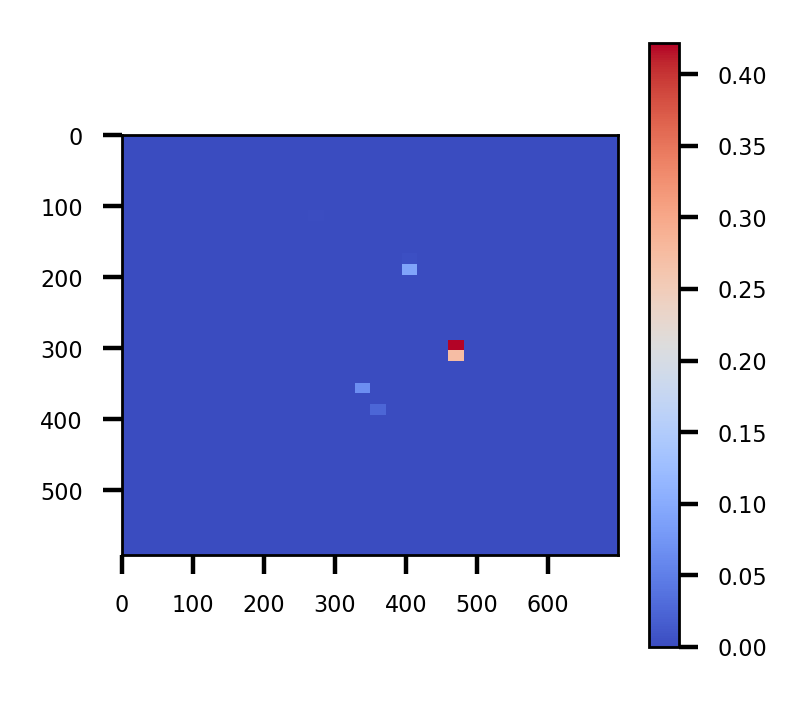

2808.0


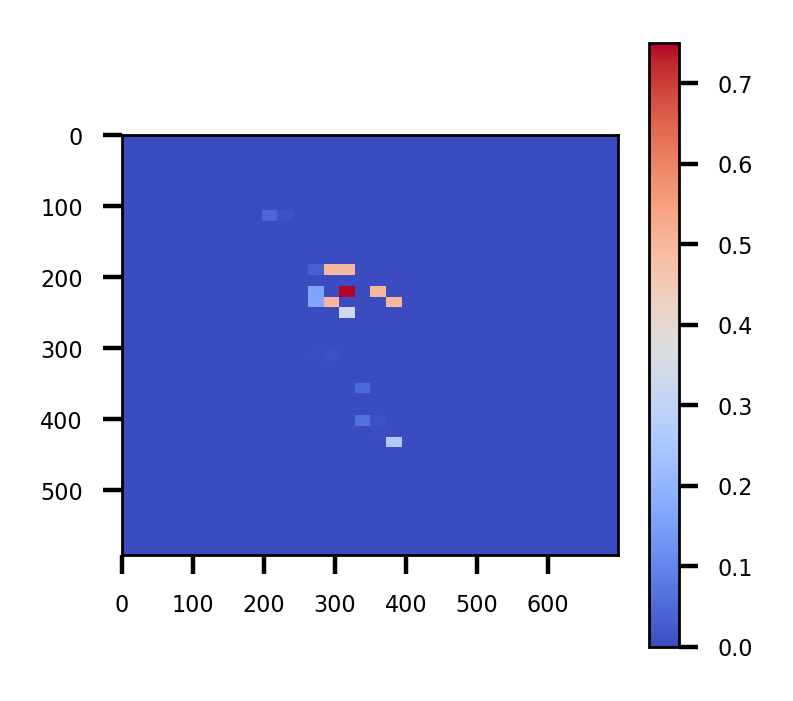

2808.0


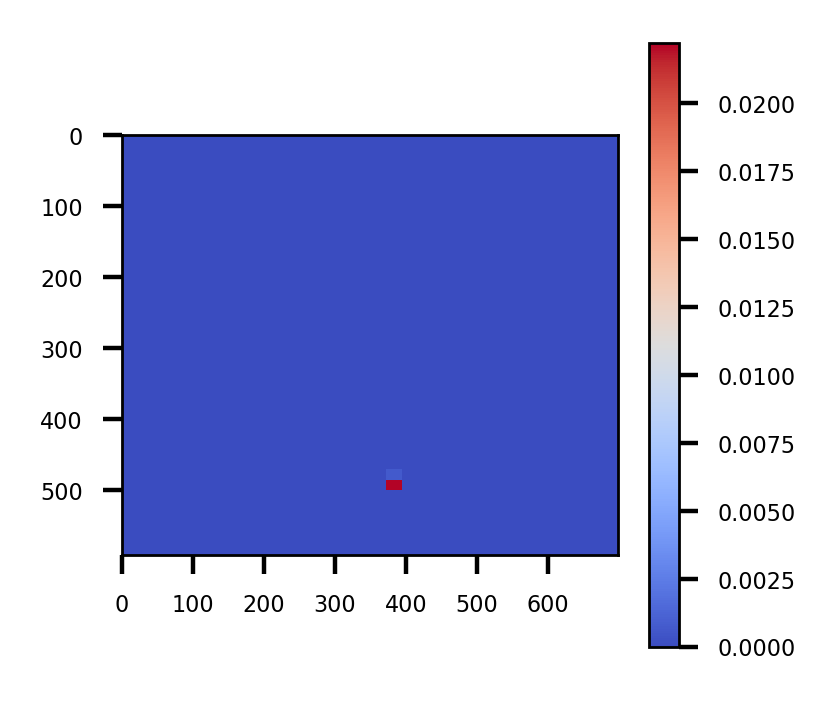

2808.0


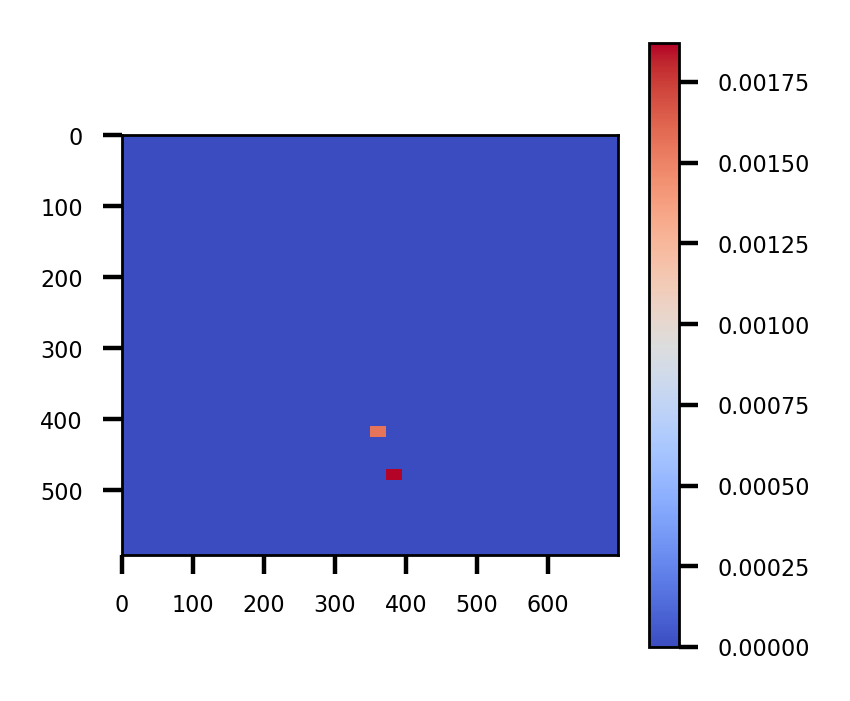

2808.0


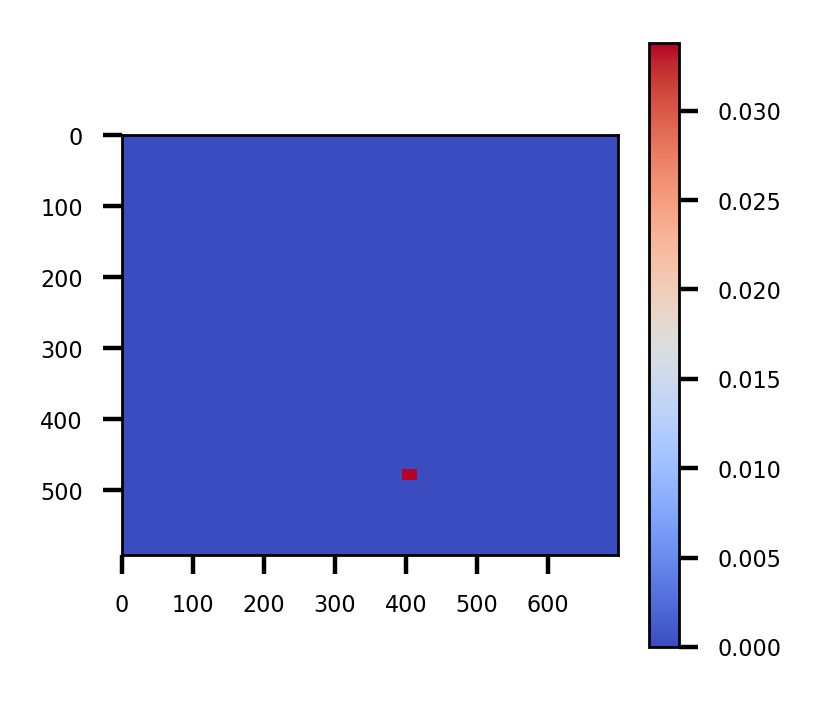

2808.0


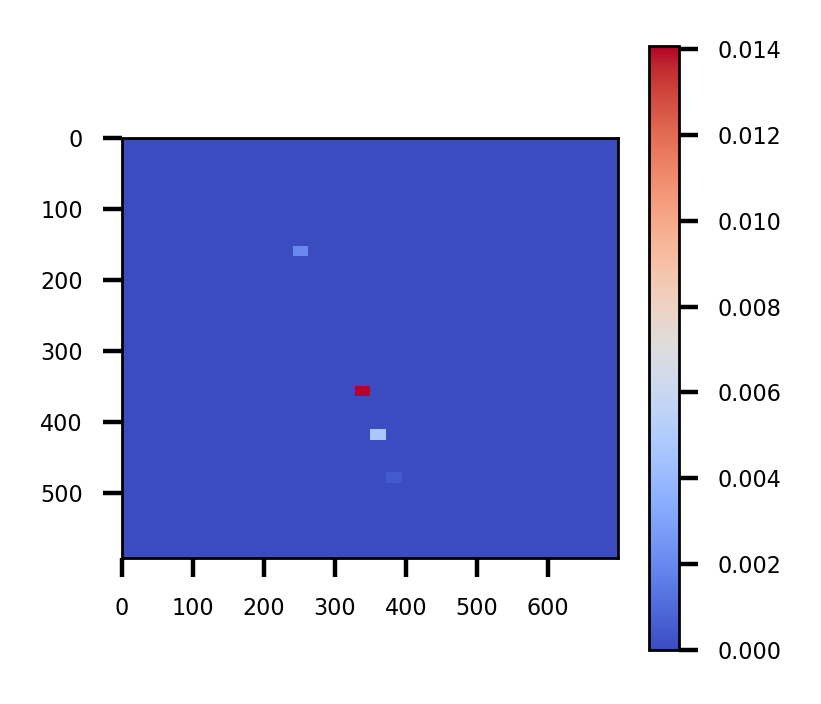

2808.0


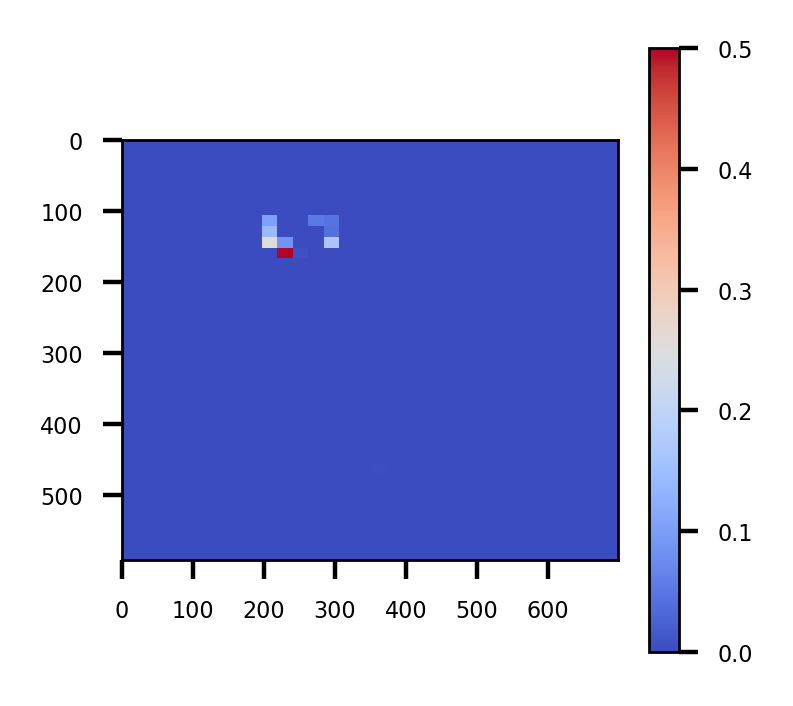

2808.0


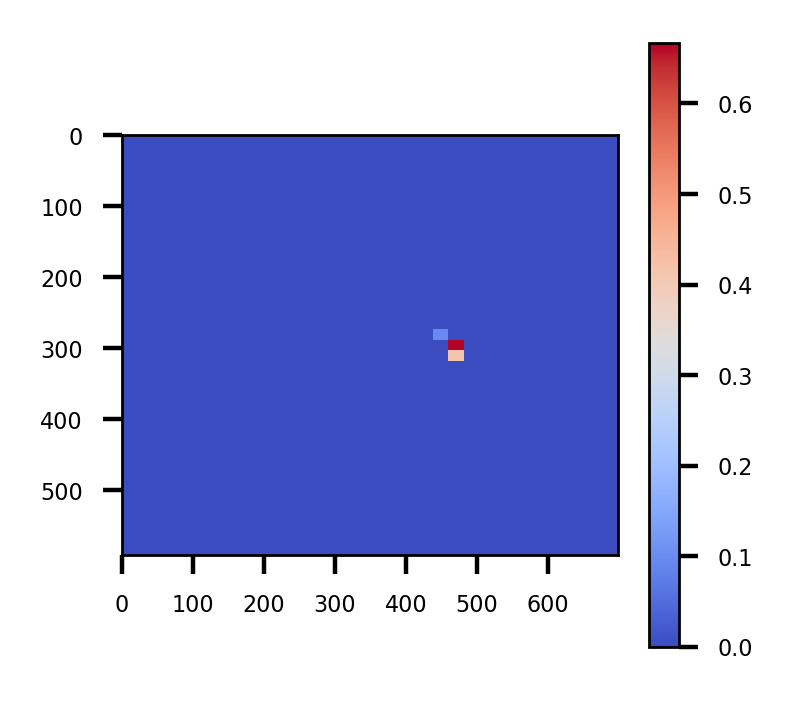

2808.0


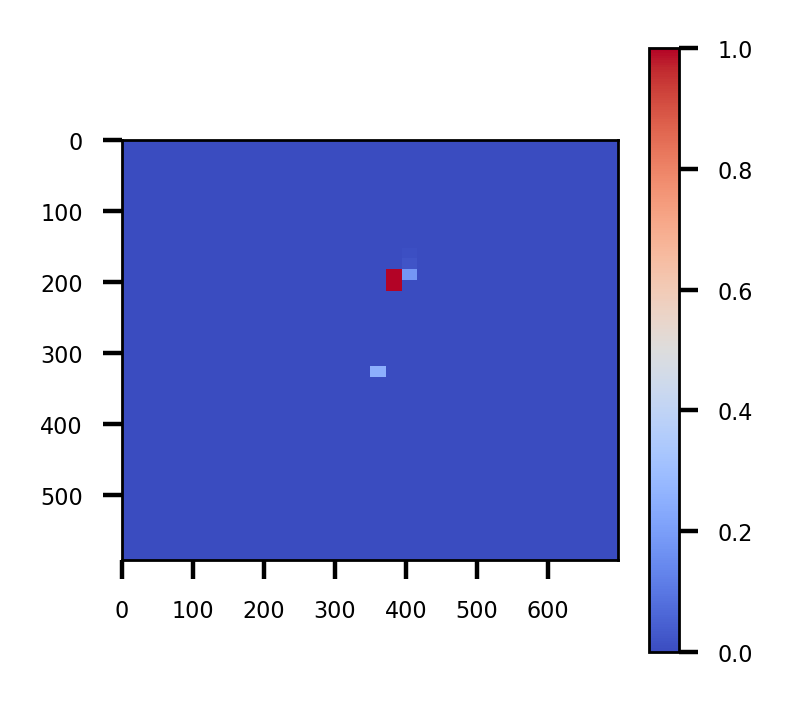

2808.0


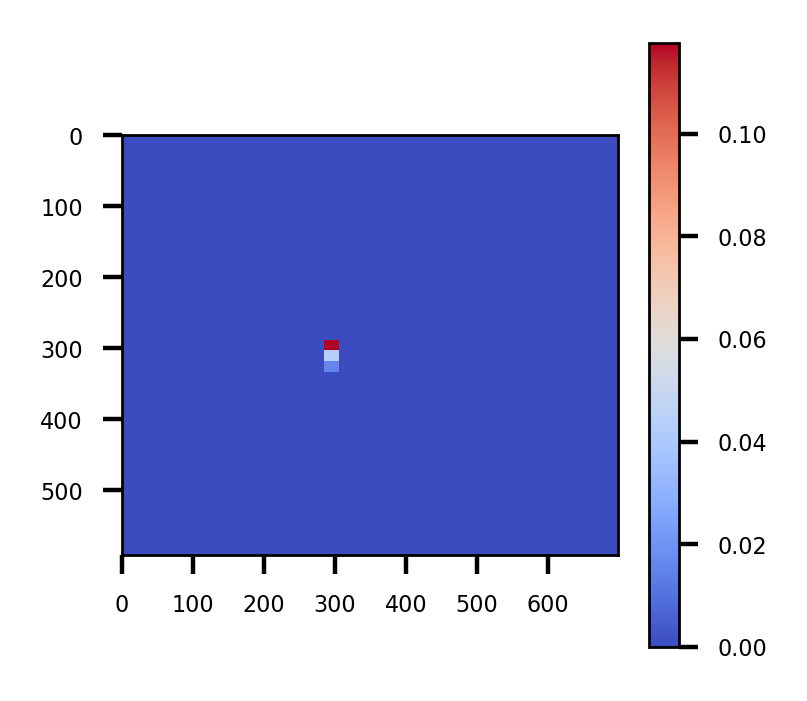

2808.0


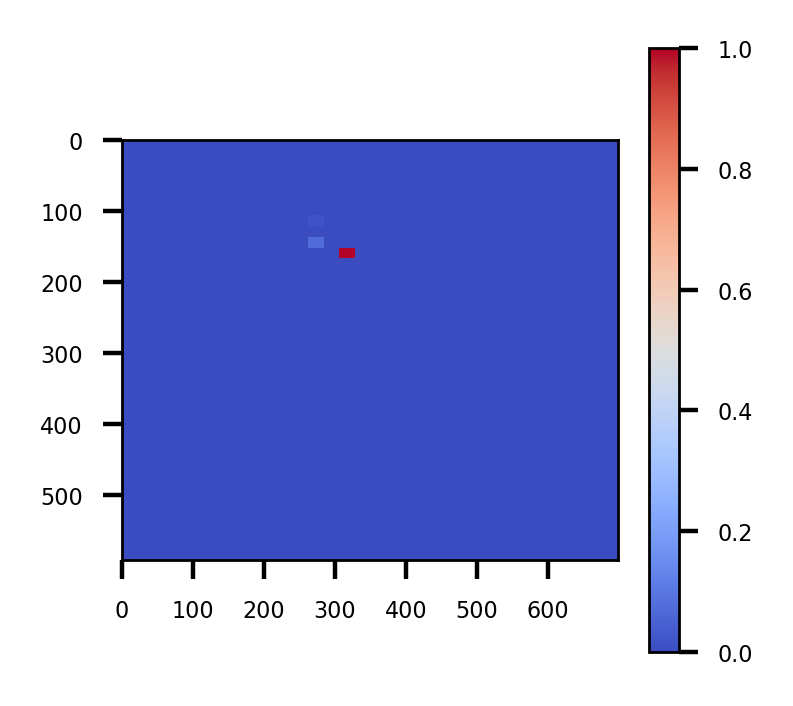

2808.0


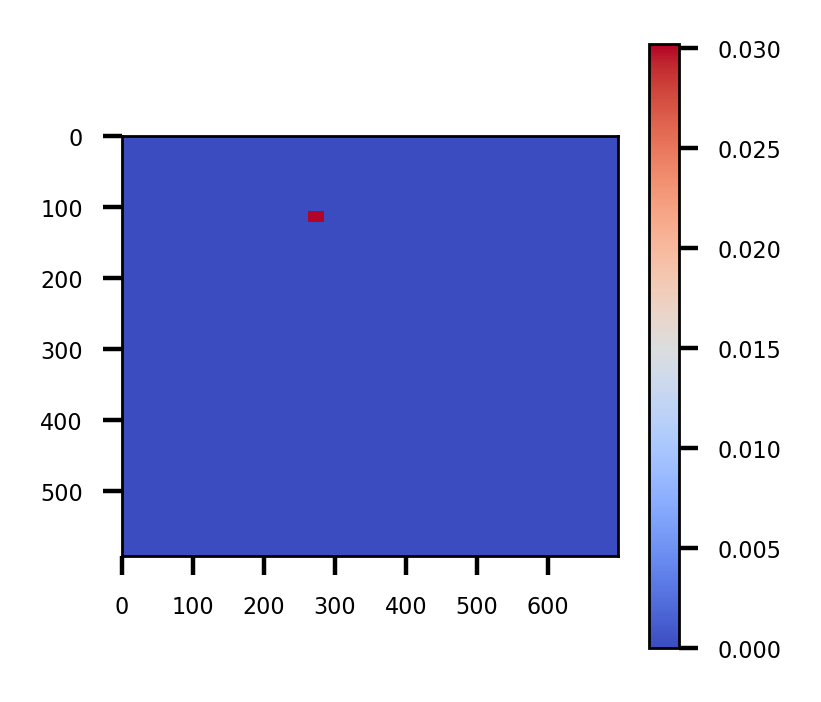

2808.0


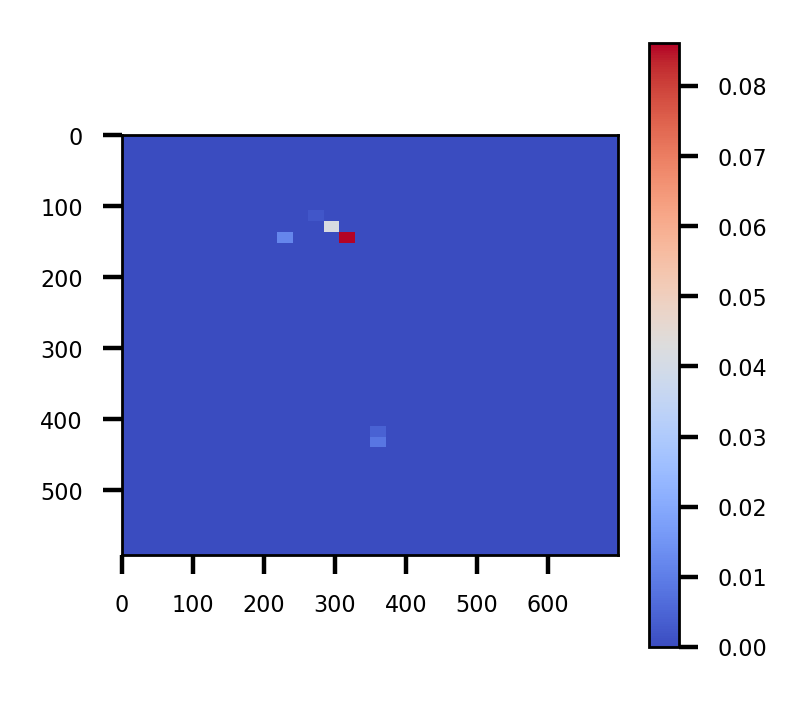

2808.0


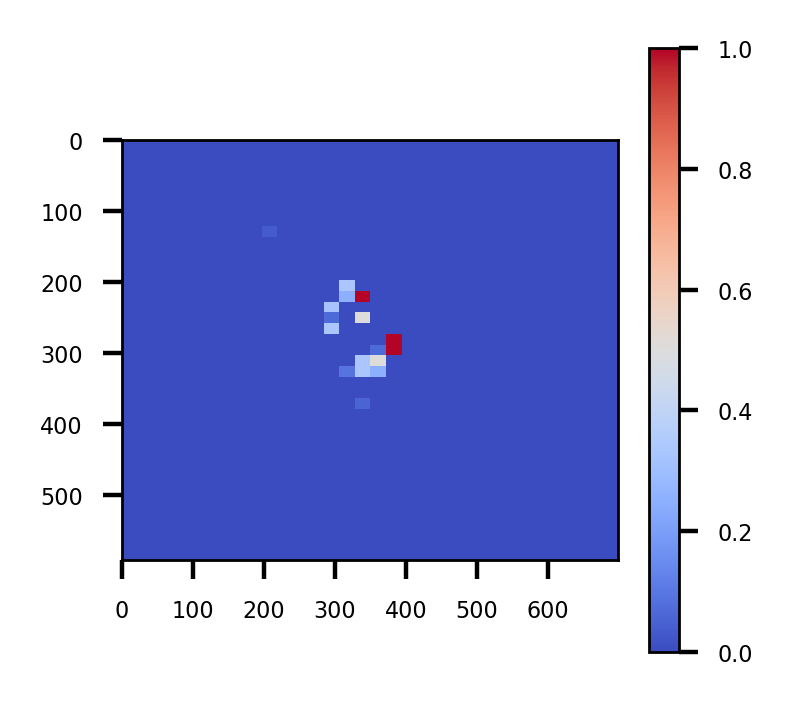

2808.0


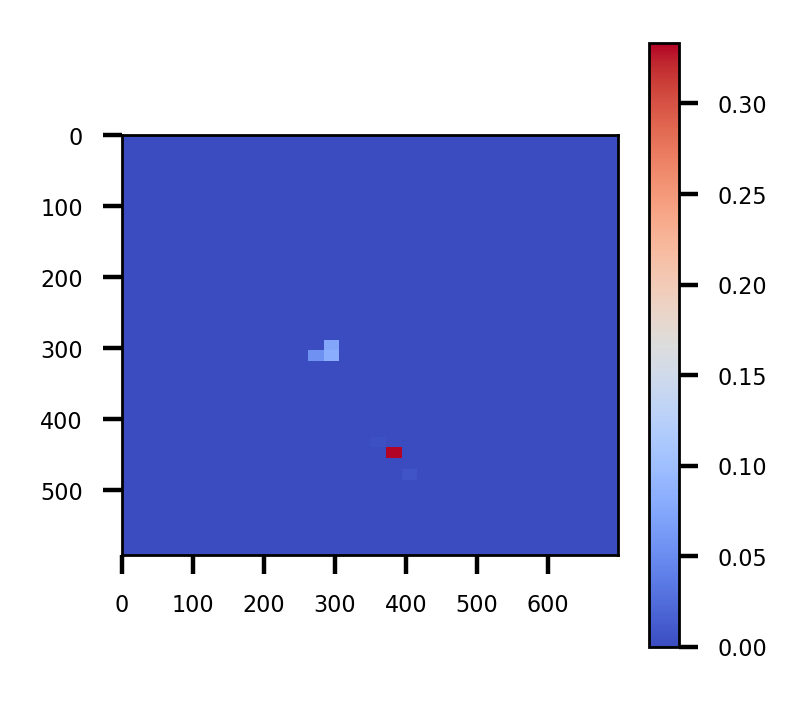

2808.0


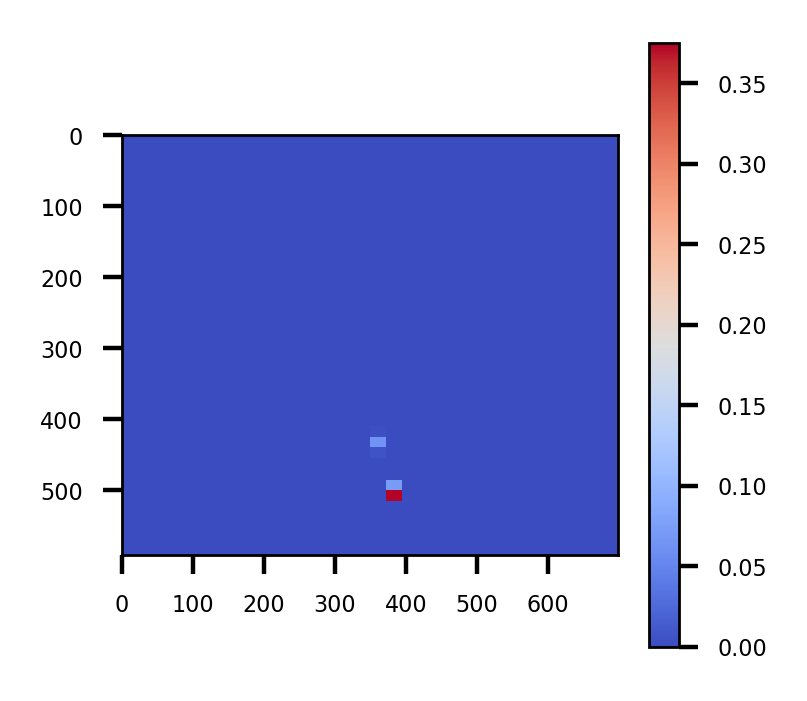

2808.0


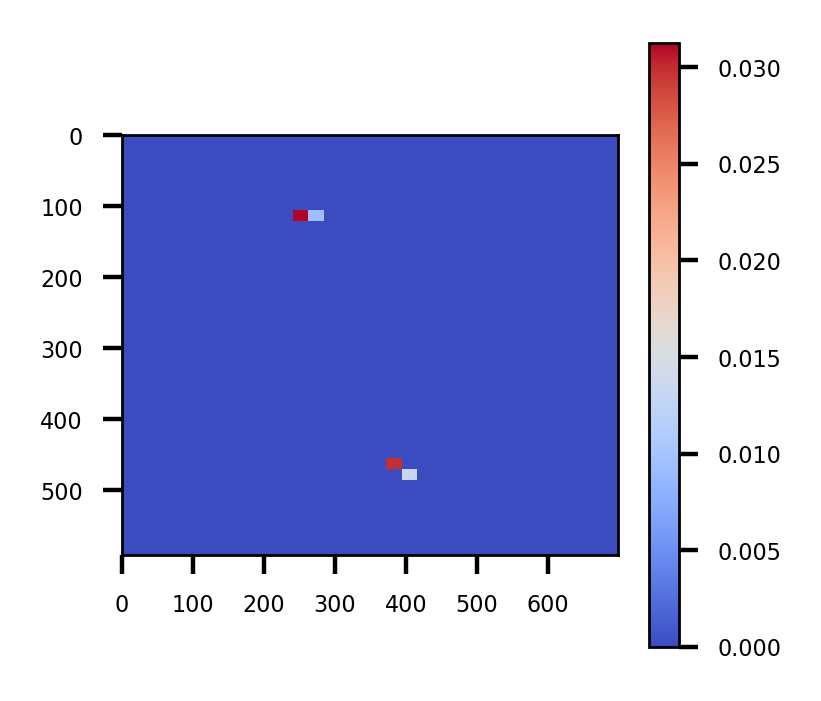

2808.0


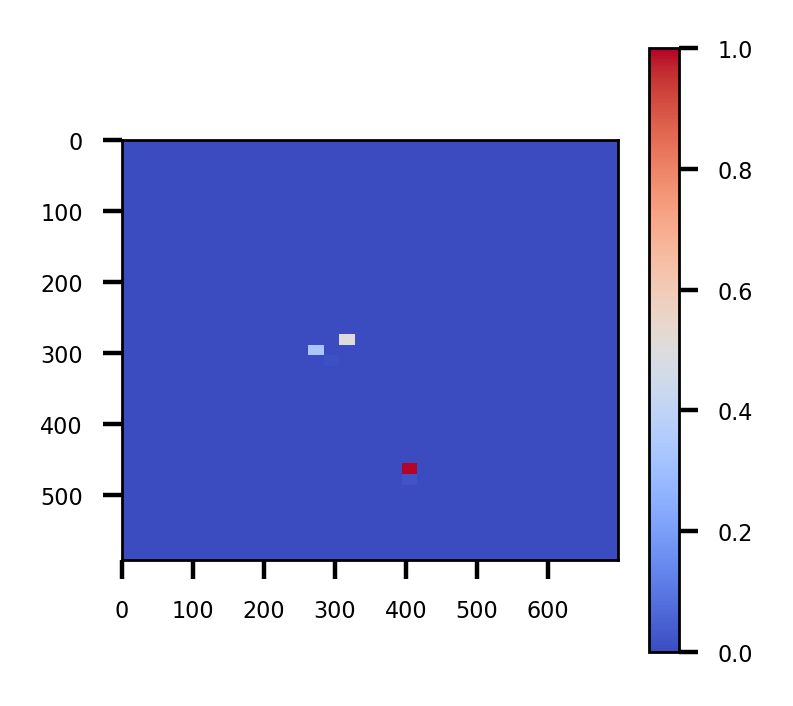

2808.0


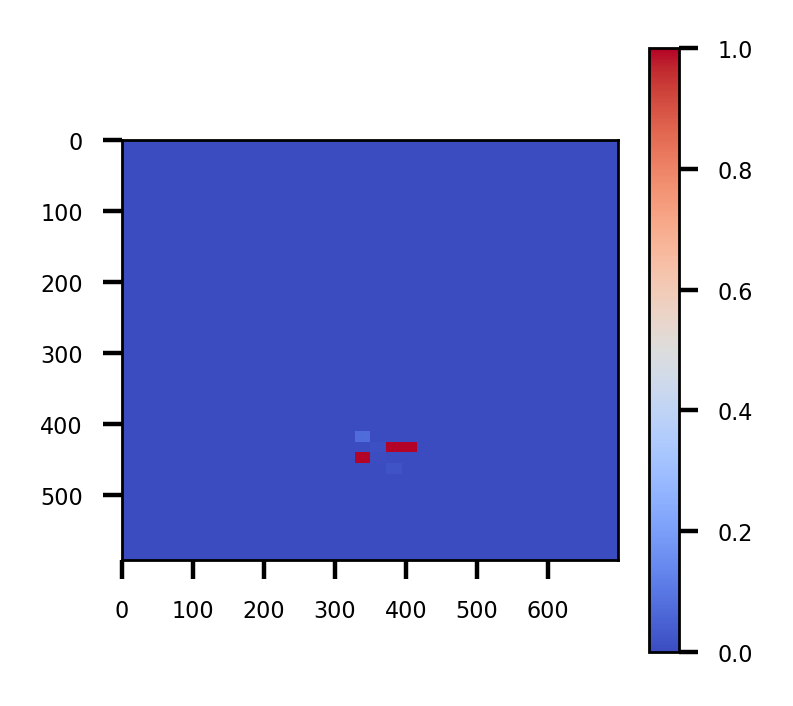

2808.0


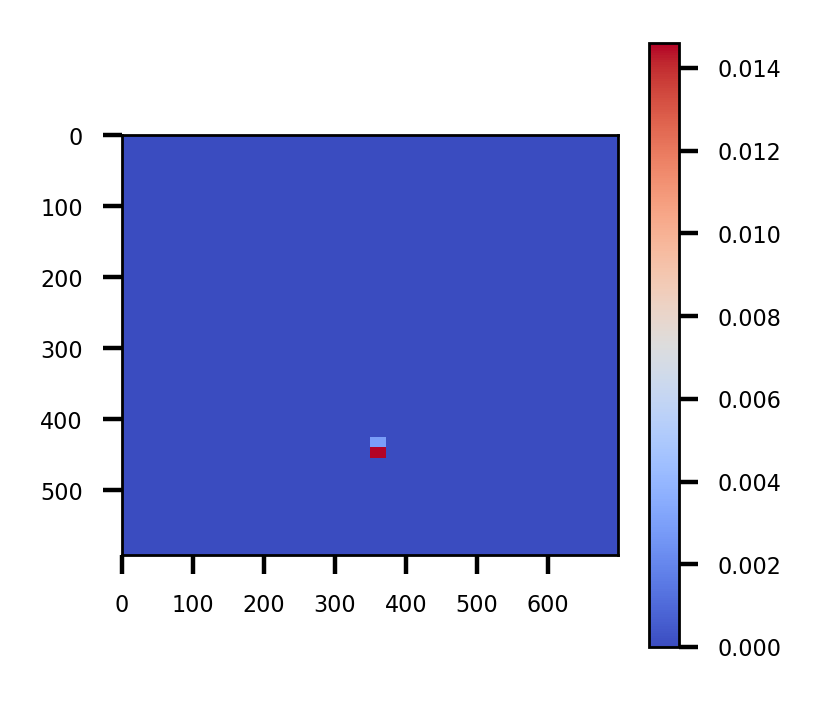

2808.0


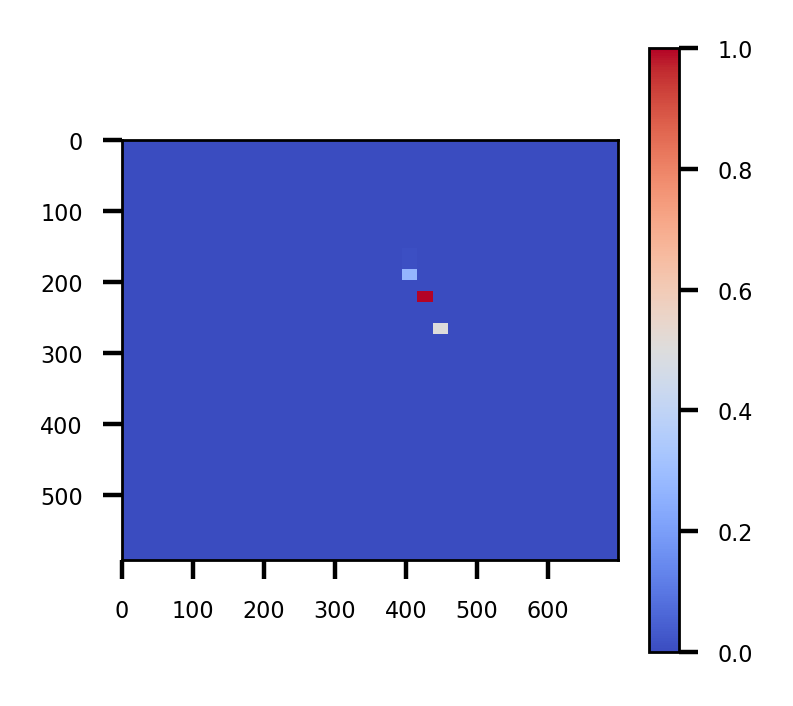

2808.0


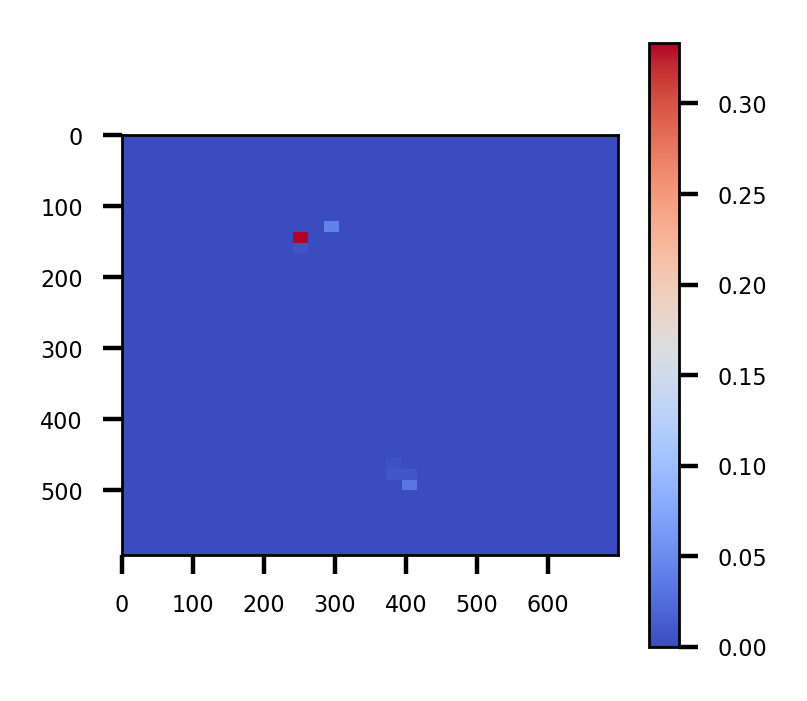

2808.0


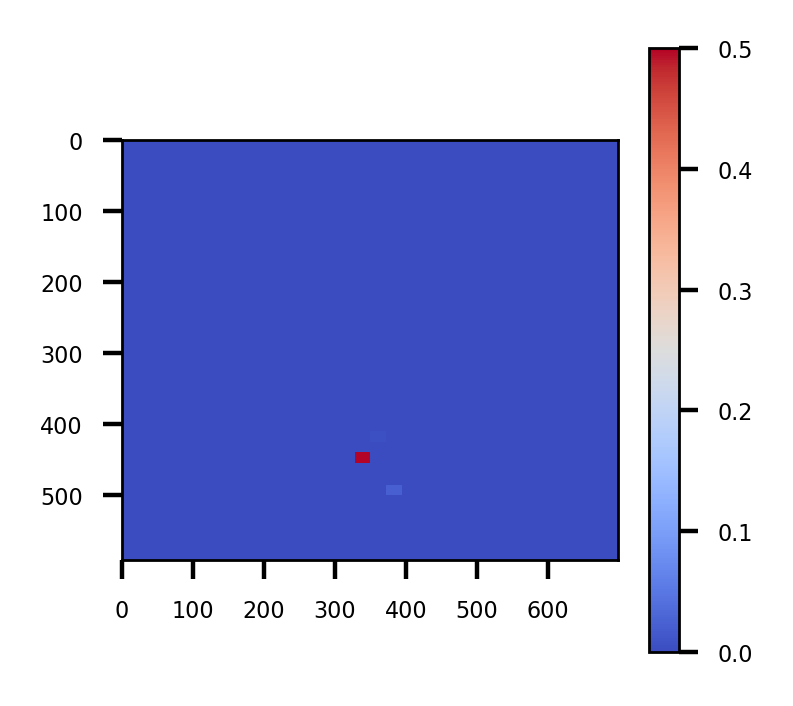

2808.0


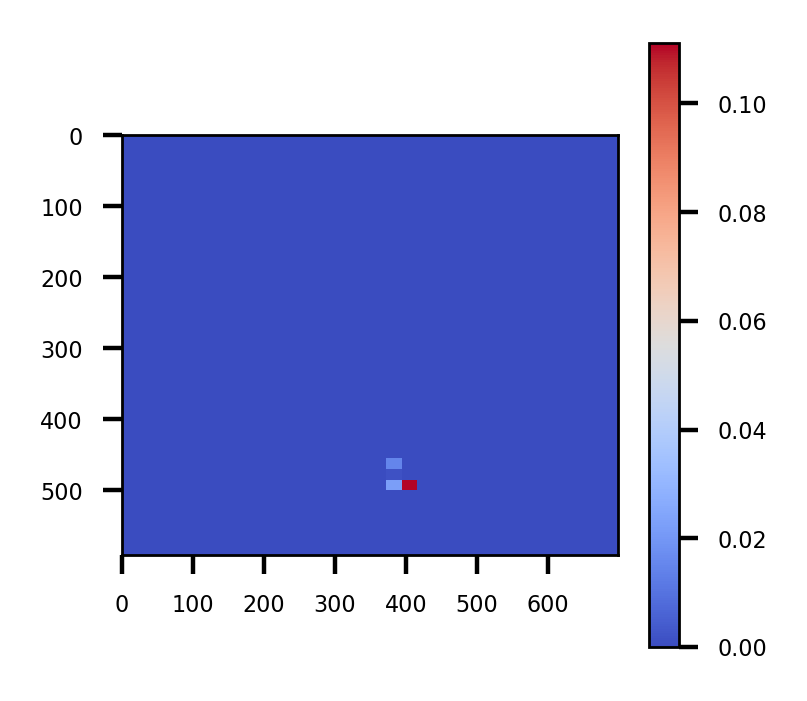

2808.0


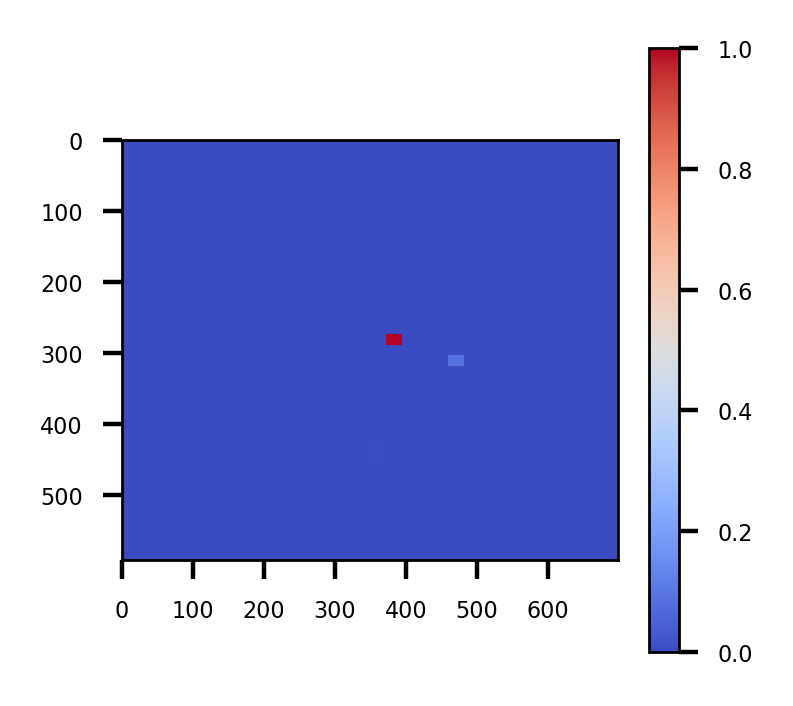

2808.0


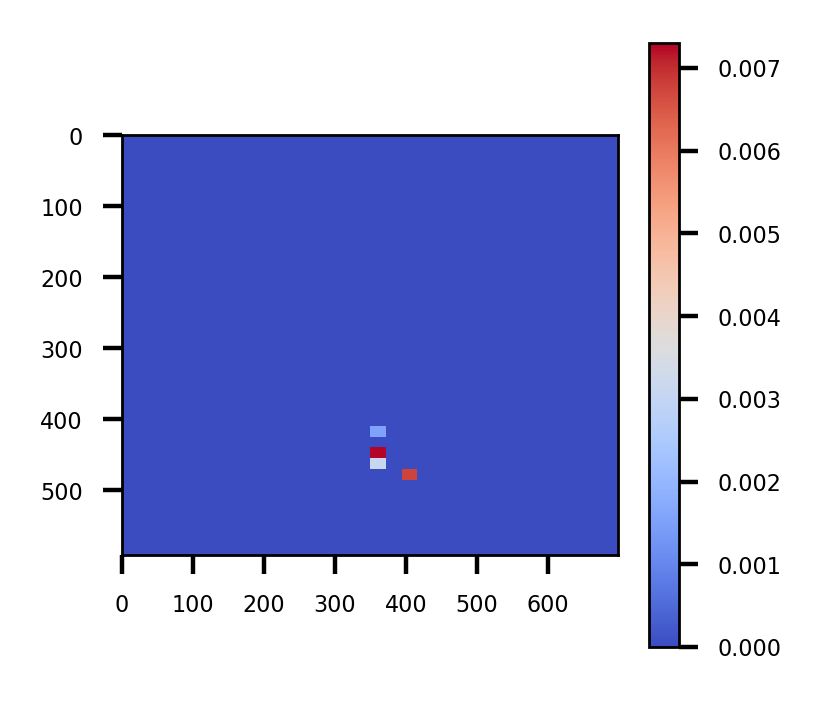

2808.0


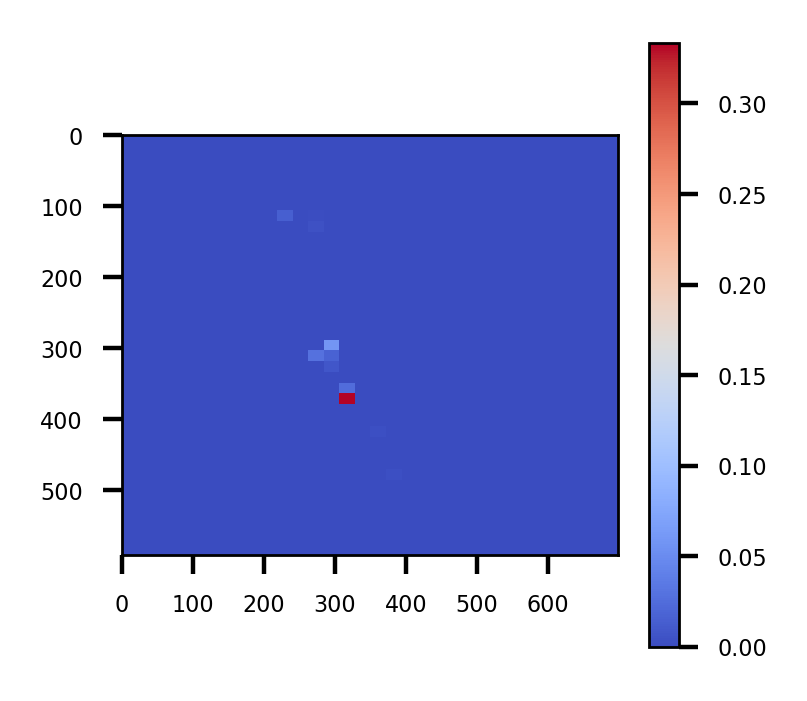

2808.0


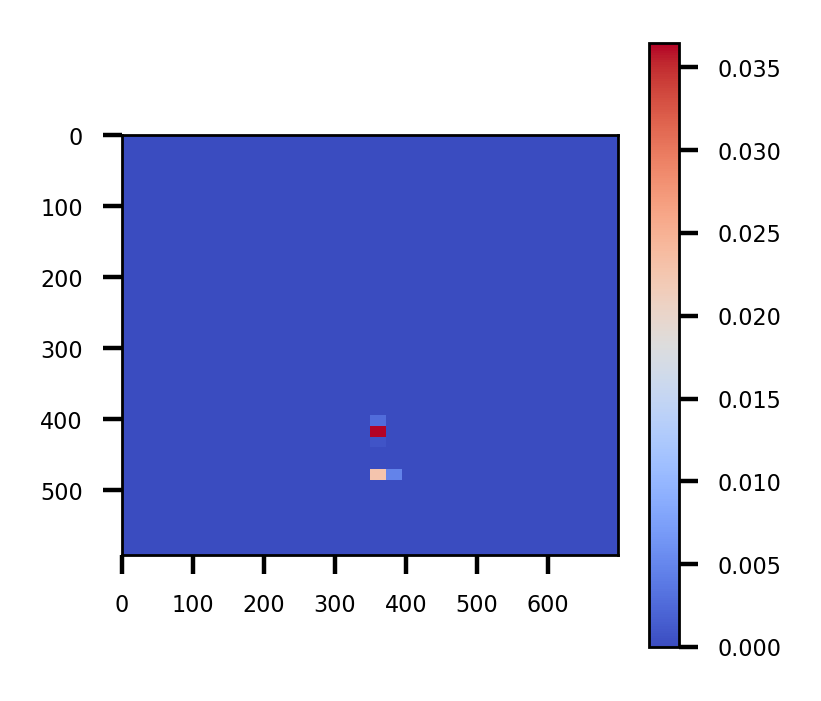

2808.0


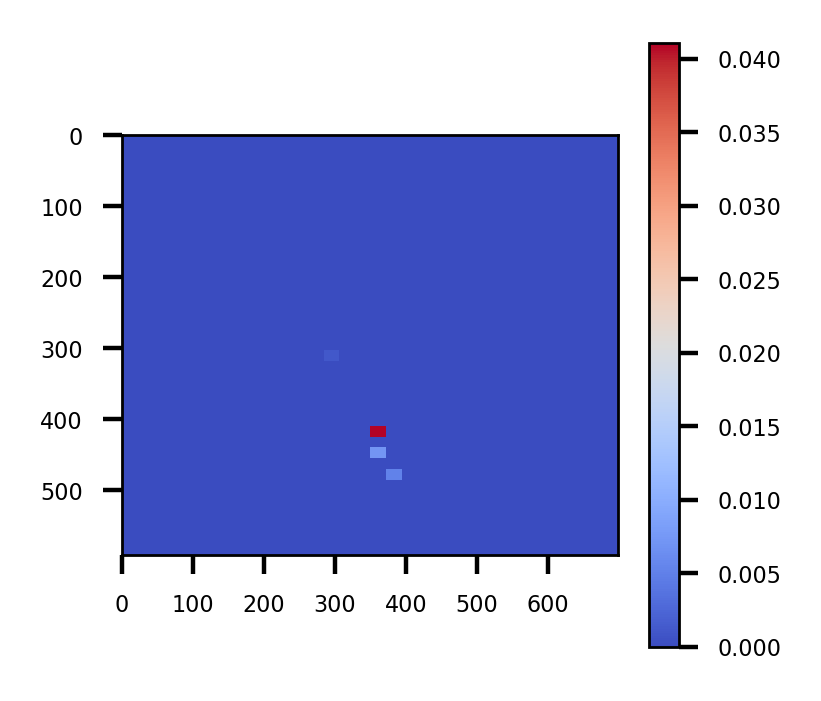

2808.0


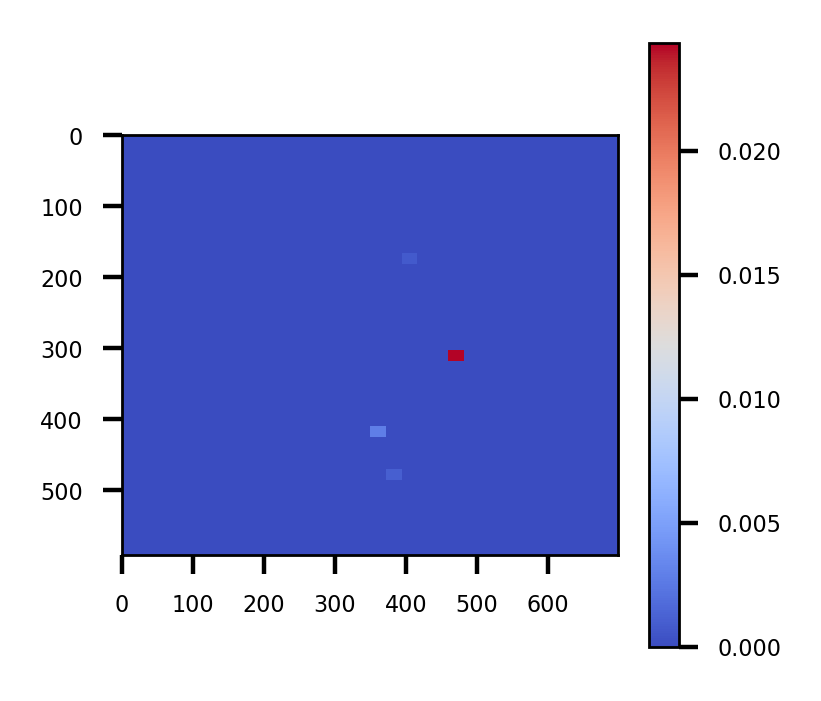

2808.0


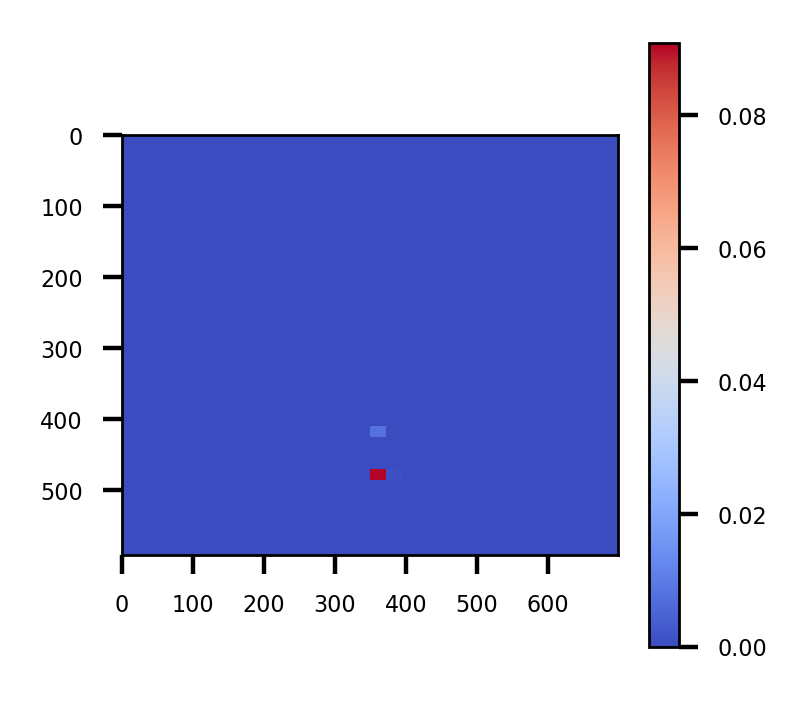

2808.0


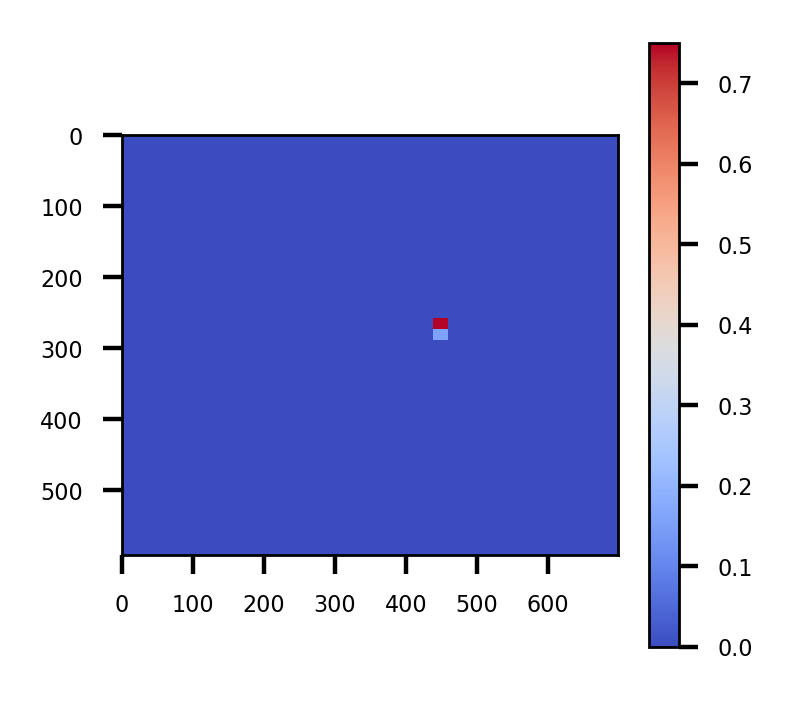

2808.0


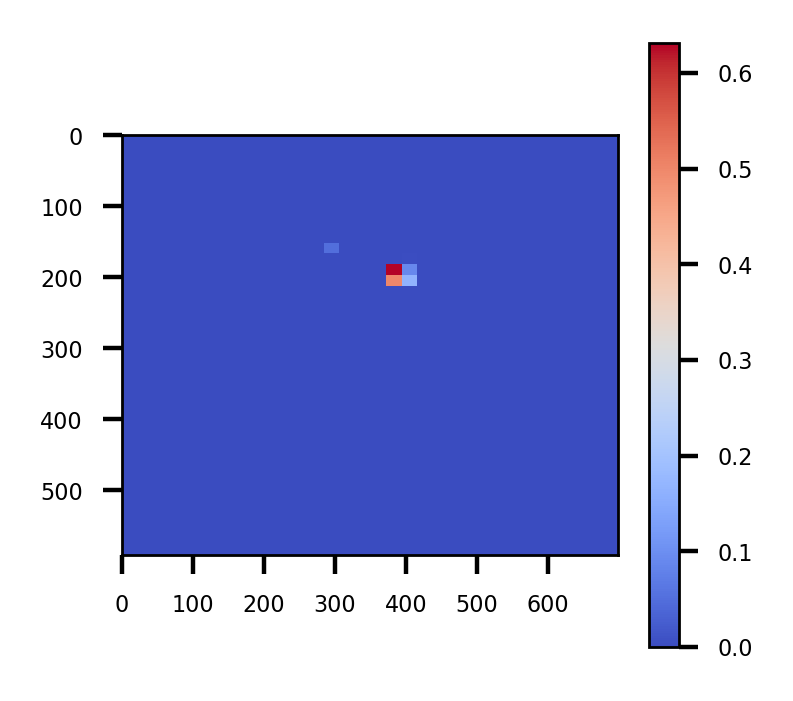

2808.0


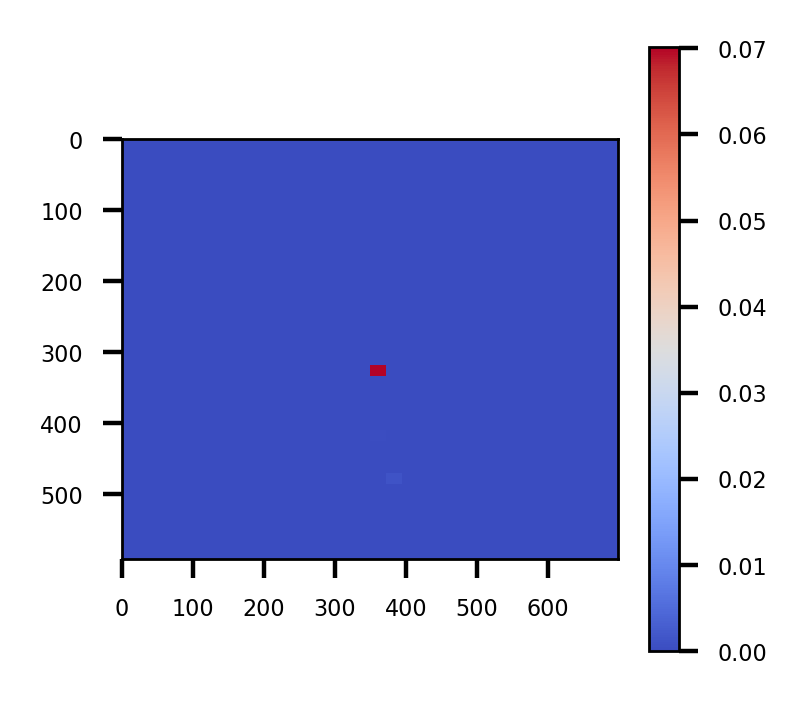

2808.0


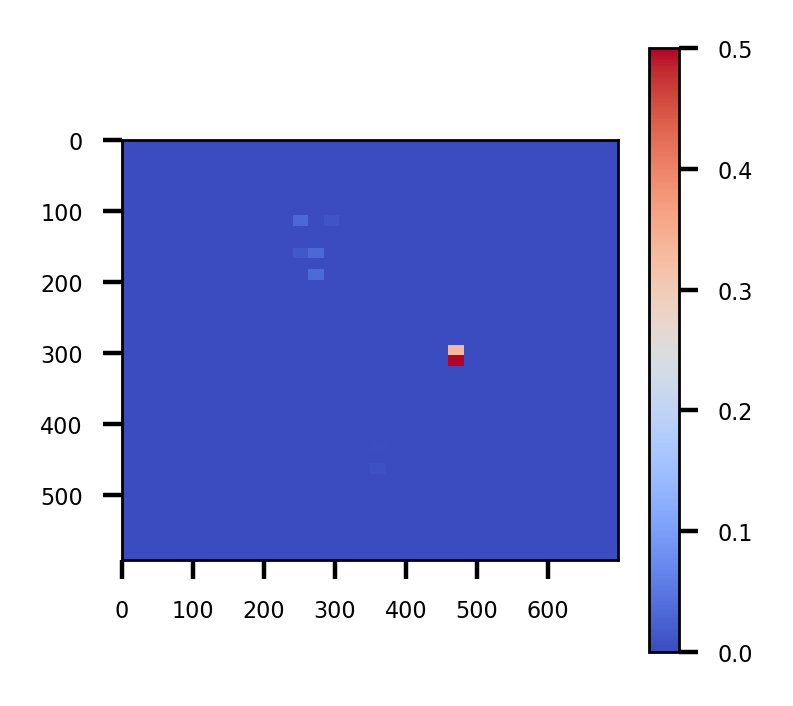

2808.0


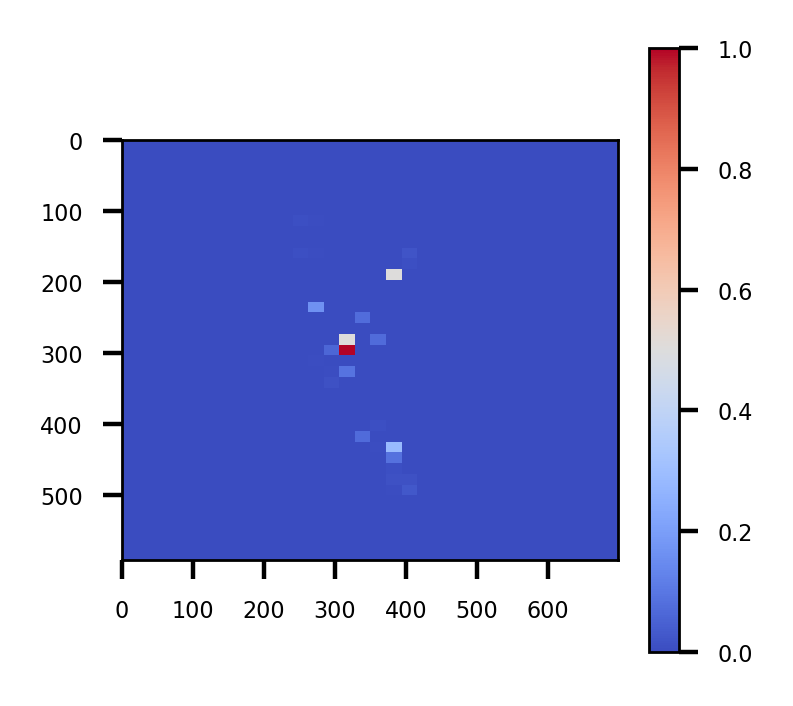

2808.0


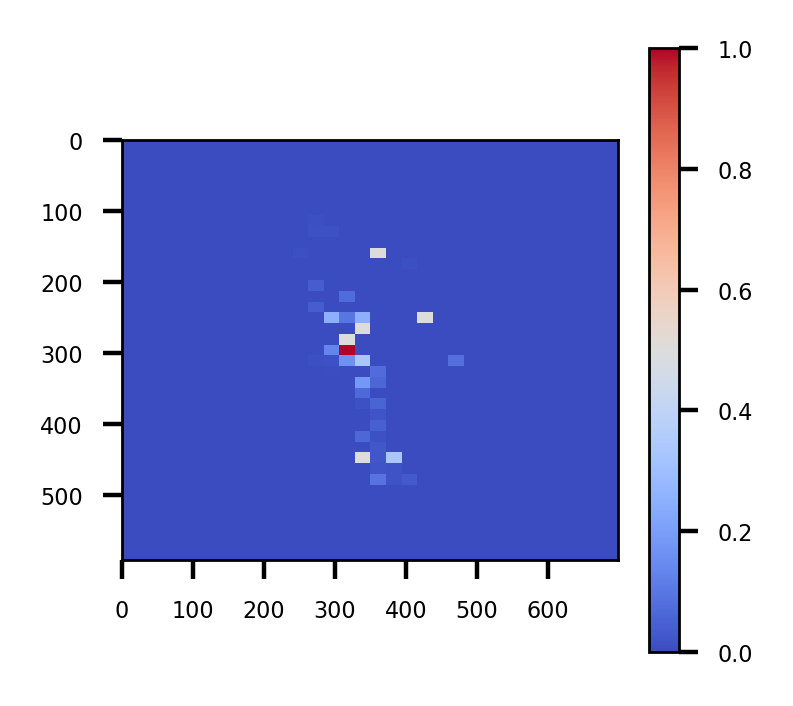

2808.0


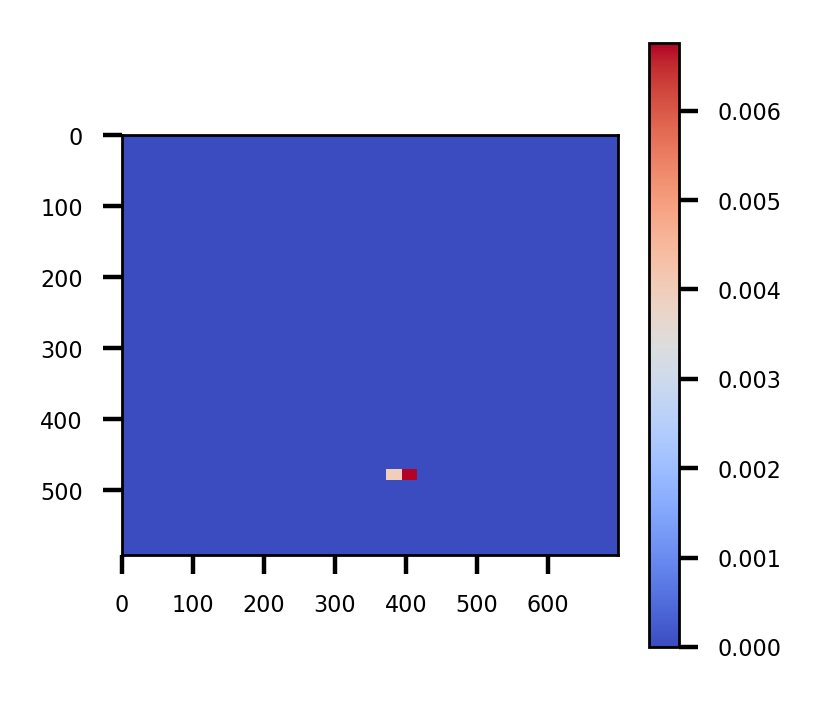

2808.0


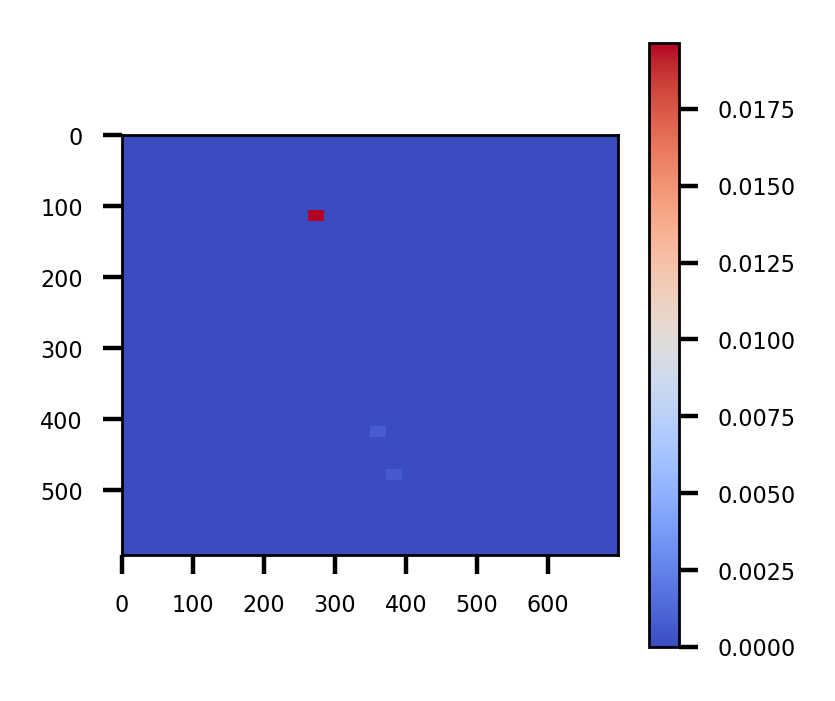

2808.0


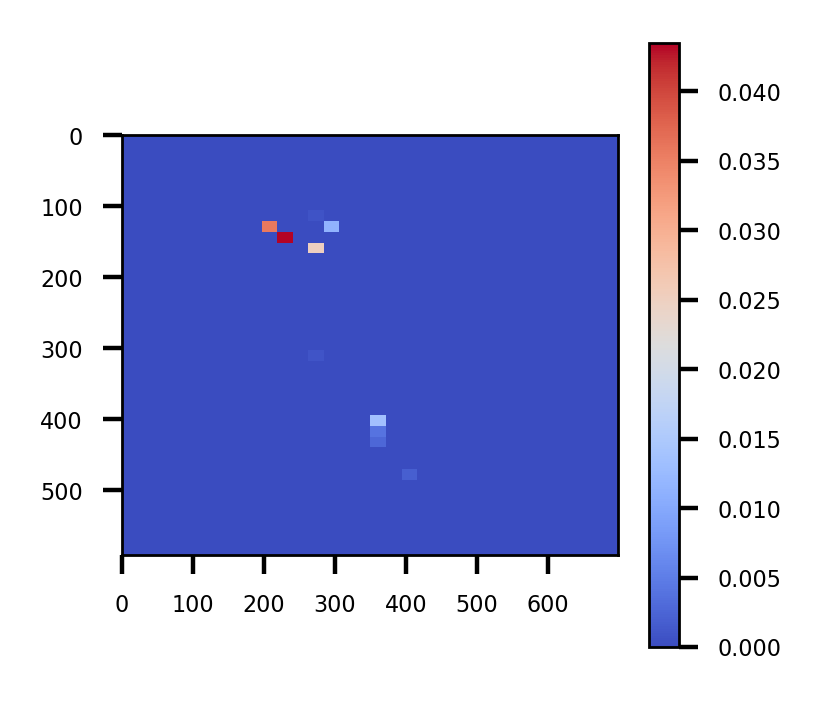

2808.0


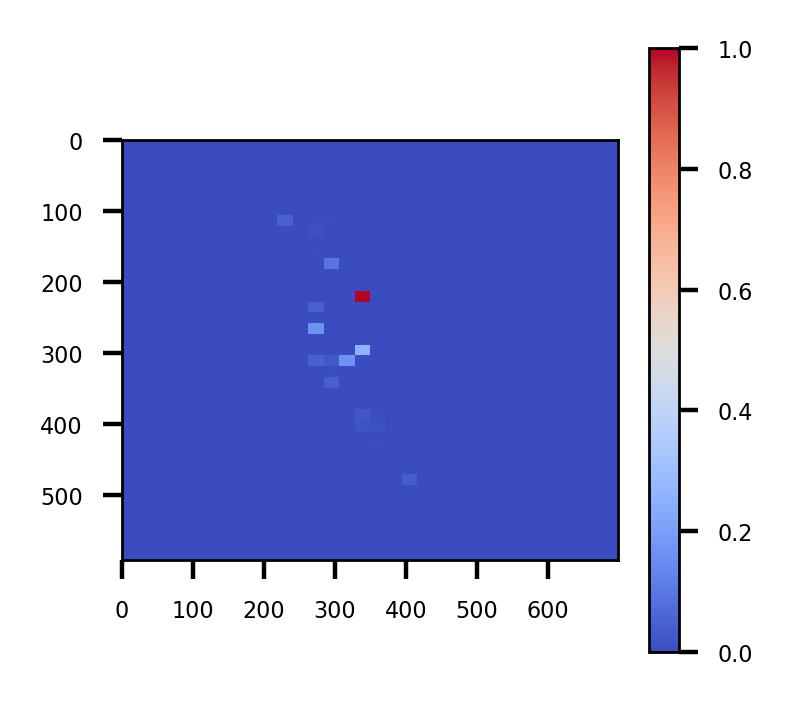

2808.0


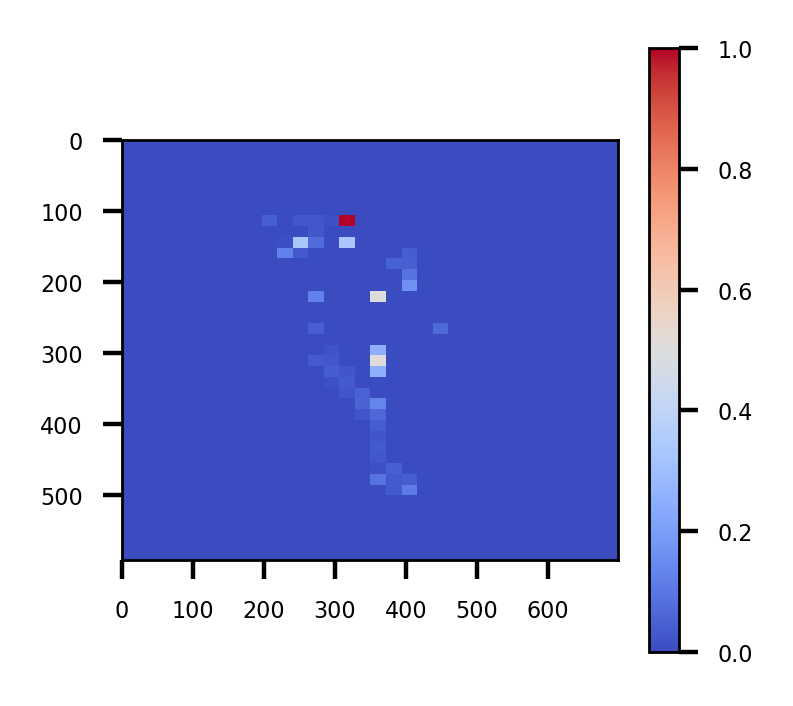

2808.0


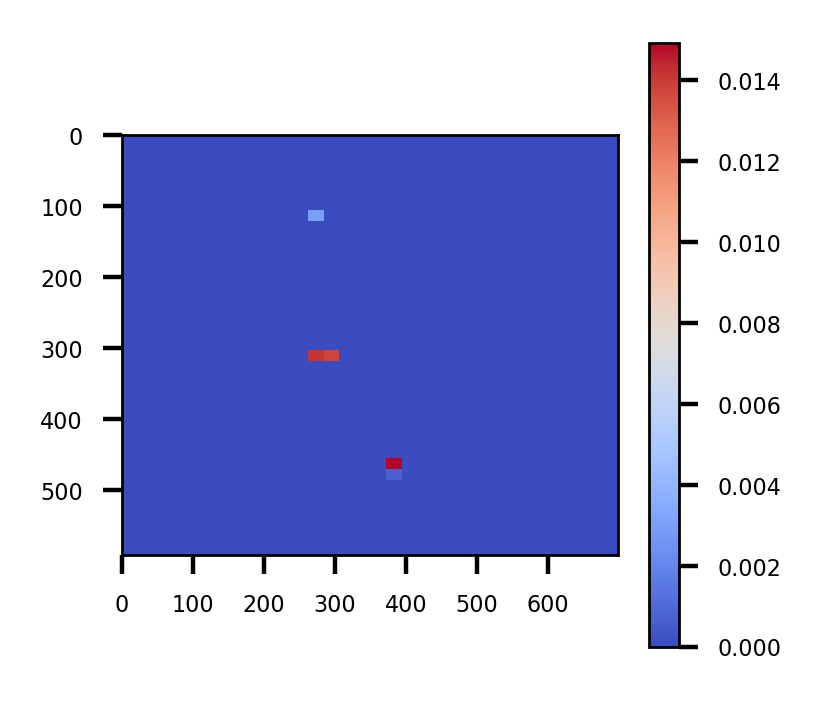

2808.0


KeyboardInterrupt: 

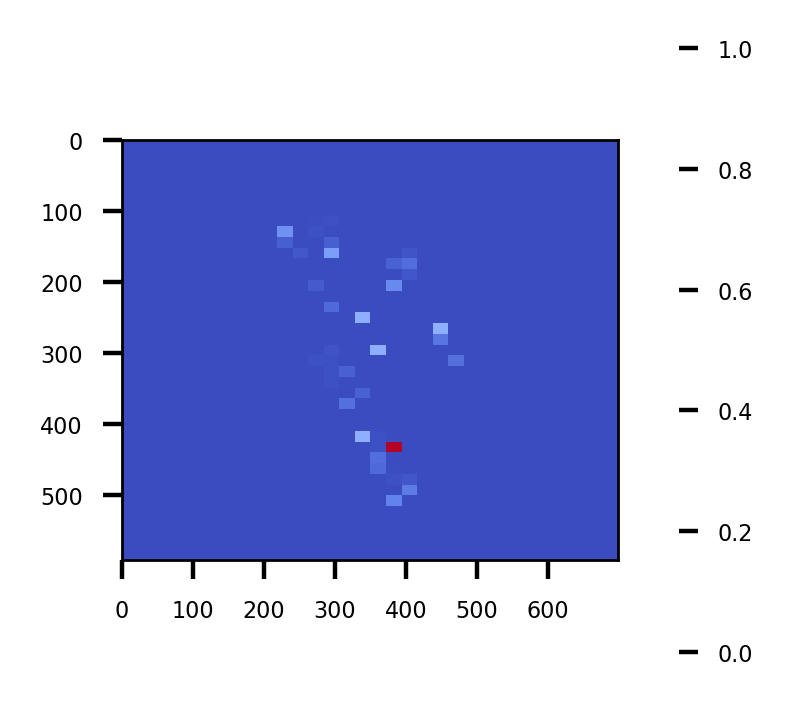

In [146]:
#Setting criteria 4 and 5 (total desired occpuancy and total ratio of events to occupancy)
#Find centre of place cell - what is the occupancy of that bin, what is the ratio of occupancy to events

total_occupancy = 5
total_events_occupancy = 2
# place_field_dic = {}   # <---- Create dictionary to store all place cells
for neuron in range(len(cols)):        
    
    xedges = np.arange(0, 700, 720/33)
    yedges = np.arange(0, 600, 500/33)

    # Read in x,y coordinates
    x = events_dlc['x']
    y = events_dlc['y']
    
    # Read in correspoding events at each x,y coordinates
    weights = events_dlc[str(cols[neuron])]
    
    # Create 2D histogram for occupancy and for events
    H, xedges, yedges = np.histogram2d(x, y, bins=(xedges, yedges))
    H = H.T  
    I, xedges, yedges = np.histogram2d(x, y, bins=(xedges, yedges), weights = weights)
    I = I.T
    
    # Criteria 4: Total occupancy is greater than 5
    print(max(np.array(H).flatten()))

    # Normalize events by occupancy and add gaussian filter
    place_field = np.nan_to_num(I/H)
#     print(max(np.array(place_field).flatten()))    
    
    
#     place_field = gaussian_filter(place_field, sigma=1)

    place_field_dic[neuron] = place_field
    
    # plot place fields (Optional)
    fig = plt.figure(num=None, figsize=(2, 2), dpi=400, facecolor='w', edgecolor='k')
    ax = plt.gca()
    plt.imshow(place_field, interpolation='nearest', origin='low',
               extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], cmap='coolwarm')
    plt.gca().invert_yaxis()
    plt.colorbar()


    # Add sandwells 
#     ax.add_patch(mpl.patches.Circle((sw1[0], sw1[1]),14,color='k', fill=False))
#     ax.add_patch(mpl.patches.Circle((sw2[0], sw2[1]),14,color='k', fill=False))
#     ax.add_patch(mpl.patches.Circle((sw3[0], sw3[1]),14,color='k', fill=False))
    plt.show()

### Objective = Compare the same cells across days - see if there are cells that change field location


1. Longitundinal registration within a session and across days (validate)

2. Concatanate all three stages from one session

3. Set criteria
    1. Cell has be a good cell both for df/f and for event traces
    2. Cell fire >3 times in any session
    3. Cell is in 0.05 mutual information percentile (threshold can be adapted) <-- update mutual information estiamtor
    4. Occupancy >5 (threshold can be adapted)
    5. Cell sort - Does the cell do anything strange
    
4. Generate output table
    - Cell | MI | Perc
5. Repeat steps 2-3 for different sessions

6. Compare centroid of place cells across sessions

7. Set criteria for 